1) Traiter le jeu de données, en :

Réfléchissant à une idée d’application.
Repérant des variables pertinentes pour les traitements à venir, et nécessaires pour votre idée d’application.
Nettoyant les données en :
mettant en évidence les éventuelles valeurs manquantes, avec au moins 3 méthodes de traitement adaptées aux variables concernées,
identifiant et en quantifiant les éventuelles valeurs aberrantes de chaque variable.
Automatisant ces traitements pour éviter de répéter ces opérations

2) Tout au long de l’analyse, produire des visualisations afin de mieux comprendre les données. Effectuer une analyse univariée pour chaque variable intéressante, afin de synthétiser son comportement.

L’appel à projets spécifie que l’analyse doit être simple à comprendre pour un public néophyte. Soyez donc attentif à la lisibilité : taille des textes, choix des couleurs, netteté suffisante, et variez les graphiques (boxplots, histogrammes, diagrammes circulaires, nuages de points…) pour illustrer au mieux votre propos.

3) Confirmer ou infirmer les hypothèses à l’aide d’une analyse multivariée. Effectuer les tests statistiques appropriés pour vérifier la significativité des résultats.

4) Justifier votre idée d’application. Identifier des arguments justifiant la faisabilité (ou non) de l’application à partir des données Open Food Facts.

5) Rédiger un rapport d’exploration et pitcher votre idée durant la soutenance du projet.

## IDEE

Pondérer le nutri score par les portions réellement consommées = > donner le nutri score du repas et non pas pour 100g

Améliorer le nutri score en proposant un score prenant en compte la présence d'additifs (ex. conservateurs, E...), allergènes... => score NOVA (niveau de transformation des aliments)

Améliorer le nutri score en proposant un score prenant en compte l'impact environnemental => Eco Score

## Chargement des librairies et vérification des versions installées

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
!pip list

Package                            Version
---------------------------------- --------------------
alabaster                          0.7.12
anaconda-client                    1.9.0
anaconda-navigator                 2.1.4
anaconda-project                   0.10.1
anyio                              2.2.0
appdirs                            1.4.4
argh                               0.26.2
argon2-cffi                        20.1.0
arrow                              0.13.1
asn1crypto                         1.4.0
astroid                            2.6.6
astropy                            4.3.1
async-generator                    1.10
atomicwrites                       1.4.0
attrs                              21.2.0
autopep8                           1.5.7
Babel                              2.9.1
backcall                           0.2.0
backports.functools-lru-cache      1.6.4
backports.shutil-get-terminal-size 1.0.0
backports.tempfile                 1.0
backports.weakref                  1.

## Chargement du jeu de données (+ check version de fichier + vue globale des données

In [3]:
food = pd.read_csv("fr.openfoodfacts.org.products.csv", sep='\t', low_memory=False)

In [4]:
import os.path, time
print("Dernière modification: %s" % time.ctime(os.path.getmtime("fr.openfoodfacts.org.products.csv")))

Dernière modification: Mon May 30 15:27:18 2022


In [5]:
food.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
food.shape

(320772, 162)

In [8]:
food.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Data columns (total 162 columns):
 #    Column                                      Non-Null Count   Dtype  
---   ------                                      --------------   -----  
 0    code                                        320749 non-null  object 
 1    url                                         320749 non-null  object 
 2    creator                                     320770 non-null  object 
 3    created_t                                   320769 non-null  object 
 4    created_datetime                            320763 non-null  object 
 5    last_modified_t                             320772 non-null  object 
 6    last_modified_datetime                      320772 non-null  object 
 7    product_name                                303010 non-null  object 
 8    generic_name                                52795 non-null   object 
 9    quantity                                    104819 non-nu

les variables/features chiffrées sont bien typées "float". Par contre, les dates sont typées 'Object", il faudra donc les convertir, on peut déjà remarquer que l'on a un nombre retaltivement élevé de valeurs nulles que l'on investiguera dans la suite

In [9]:
food.sample(5)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
91747,0076479645127,http://world-fr.openfoodfacts.org/produit/0076...,usda-ndb-import,1489071231,2017-03-09T14:53:51Z,1489071231,2017-03-09T14:53:51Z,"Giuliano, Sliced Imported Greek Kalamata Olive",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
246198,3596710367054,http://world-fr.openfoodfacts.org/produit/3596...,kiliweb,1490635310,2017-03-27T17:21:50Z,1490635310,2017-03-27T17:21:50Z,Penne poulet champignon,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN,NaN
126244,0688267160042,http://world-fr.openfoodfacts.org/produit/0688...,usda-ndb-import,1489058926,2017-03-09T11:28:46Z,1489058926,2017-03-09T11:28:46Z,Spicy Mexican Style Finishing Sauce,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN,NaN
69704,0070253102363,http://world-fr.openfoodfacts.org/produit/0070...,usda-ndb-import,1489093127,2017-03-09T20:58:47Z,1489093127,2017-03-09T20:58:47Z,Rising Crust Three Meat Pizza,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,11.0,11.0,NaN,NaN
256430,4000521144814,http://world-fr.openfoodfacts.org/produit/4000...,openfoodfacts-contributors,1487673109,2017-02-21T10:31:49Z,1487673109,2017-02-21T10:31:49Z,Arôme vanille,NaN,4x2 ml,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
pd.options.display.max_rows = None
pd.options.display.max_columns = None

nb de valeurs nulles par variables :

In [11]:
val_null = food.isnull().sum().sort_values(ascending = False)
val_null

water-hardness_100g                           320772
no_nutriments                                 320772
ingredients_that_may_be_from_palm_oil         320772
nutrition_grade_uk                            320772
nervonic-acid_100g                            320772
erucic-acid_100g                              320772
mead-acid_100g                                320772
elaidic-acid_100g                             320772
butyric-acid_100g                             320772
caproic-acid_100g                             320772
ingredients_from_palm_oil                     320772
lignoceric-acid_100g                          320772
cerotic-acid_100g                             320772
melissic-acid_100g                            320772
chlorophyl_100g                               320772
glycemic-index_100g                           320772
myristic-acid_100g                            320771
palmitic-acid_100g                            320771
caprylic-acid_100g                            

à titre indicatif, moyenne et médiane (nb de valeurs nulles)

In [12]:
val_null.mean()

244497.46296296295

In [13]:
val_null.median()

314253.5

Analyse rapide de la variable 'labels' pour voir si elle est utilisable dans le cadre de l'idée d'application (au-delà du côté rempli/non rempli)

In [14]:
pd.unique(food['labels'])

array([nan, 'AB', 'Point Vert', ...,
       'Peu ou pas de sucre,Sans gluten,Sans sucre ajouté,Œuf',
       'Sans sucres,Ne pas donner aux enfants de moins de 5 ans',
       'Dolphin friendly,Fished by pole & line,Recyclable steel'],
      dtype=object)

In [15]:
sans_gluten = food.loc[food['labels'] == 'Sans gluten']
sans_gluten.sample(10)

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,packaging,packaging_tags,brands,brands_tags,categories,categories_tags,categories_fr,origins,origins_tags,manufacturing_places,manufacturing_places_tags,labels,labels_tags,labels_fr,emb_codes,emb_codes_tags,first_packaging_code_geo,cities,cities_tags,purchase_places,stores,countries,countries_tags,countries_fr,ingredients_text,allergens,allergens_fr,traces,traces_tags,traces_fr,serving_size,no_nutriments,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_from_palm_oil,ingredients_from_palm_oil_tags,ingredients_that_may_be_from_palm_oil_n,ingredients_that_may_be_from_palm_oil,ingredients_that_may_be_from_palm_oil_tags,nutrition_grade_uk,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states,states_tags,states_fr,main_category,main_category_fr,image_url,image_small_url,energy_100g,energy-from-fat_100g,fat_100g,saturated-fat_100g,butyric-acid_100g,caproic-acid_100g,caprylic-acid_100g,capric-acid_100g,lauric-acid_100g,myristic-acid_100g,palmitic-acid_100g,stearic-acid_100g,arachidic-acid_100g,behenic-acid_100g,lignoceric-acid_100g,cerotic-acid_100g,montanic-acid_100g,melissic-acid_100g,monounsaturated-fat_100g,polyunsaturated-fat_100g,omega-3-fat_100g,alpha-linolenic-acid_100g,eicosapentaenoic-acid_100g,docosahexaenoic-acid_100g,omega-6-fat_100g,linoleic-acid_100g,arachidonic-acid_100g,gamma-linolenic-acid_100g,dihomo-gamma-linolenic-acid_100g,omega-9-fat_100g,oleic-acid_100g,elaidic-acid_100g,gondoic-acid_100g,mead-acid_100g,erucic-acid_100g,nervonic-acid_100g,trans-fat_100g,cholesterol_100g,carbohydrates_100g,sugars_100g,sucrose_100g,glucose_100g,fructose_100g,lactose_100g,maltose_100g,maltodextrins_100g,starch_100g,polyols_100g,fiber_100g,proteins_100g,casein_100g,serum-proteins_100g,nucleotides_100g,salt_100g,sodium_100g,alcohol_100g,vitamin-a_100g,beta-carotene_100g,vitamin-d_100g,vitamin-e_100g,vitamin-k_100g,vitamin-c_100g,vitamin-b1_100g,vitamin-b2_100g,vitamin-pp_100g,vitamin-b6_100g,vitamin-b9_100g,folates_100g,vitamin-b12_100g,biotin_100g,pantothenic-acid_100g,silica_100g,bicarbonate_100g,potassium_100g,chloride_100g,calcium_100g,phosphorus_100g,iron_100g,magnesium_100g,zinc_100g,copper_100g,manganese_100g,fluoride_100g,selenium_100g,chromium_100g,molybdenum_100g,iodine_100g,caffeine_100g,taurine_100g,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
303676,8008698005118,http://world-fr.openfoodfacts.org/produit/8008...,pierrekilly,1434019737,2015-06-11T10:48:57Z,1462030112,2016-04-30T15:28:32Z,Farine sans gluten,NaN,1 kg,Sachet,sachet,Schär,schar,Farines,"en:plant-based-foods-and-beverages,en:plant-ba...","Aliments et boissons à base de végétaux,Alimen...",NaN,NaN,NaN,NaN,Sans gluten,en:gluten-free,Sans gluten,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,en:france,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"en:to-be-completed, en:nutrition-facts-to-be-c...","en:to-be-completed,en:nutrition-facts-to-be-co...","A compléter,Informations nutritionnelles à com...",en:flours,Farines,http://fr.openfoodfacts.org/images/products/80...,http://fr.openfoodfacts.org/images/products/80...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
275672,5390248530007,http://world-fr.openfoodfacts.org/produit/5390...,teolemon,1459936291,2016-04-06T09:51:31Z,1491207980,2017-04-03T08:26:20Z,Roast Beef & Irish Stout Potato Crisps,Roast Beef & Irish S

In [16]:
sans_gluten.shape

(259, 162)

In [17]:
food['labels'].nunique()

18114

In [18]:
food['labels_tags'].nunique()

13653

des données intéressantes (ex. 'sans gluten') existent mais sont effectivement trop peu remplies en l'état pour être véritablement exploitables

## Reprise de l'analyse du taux de remplissage

utilisation du package missingno

In [19]:
import missingno as msno
%matplotlib inline

<AxesSubplot:>

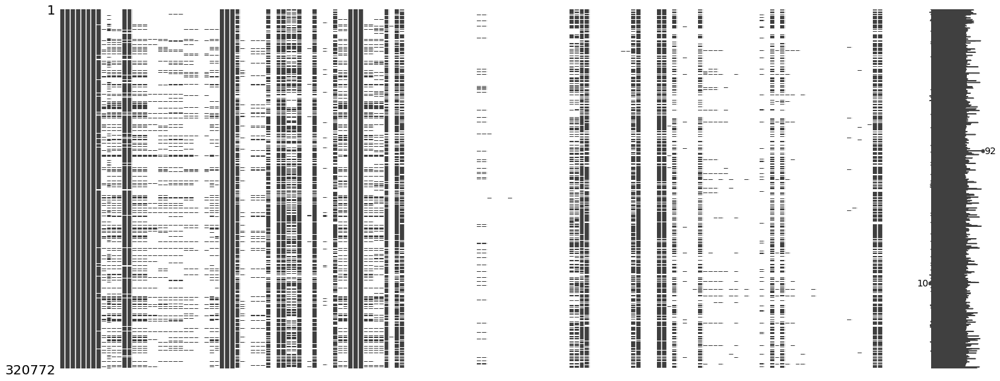

In [20]:
msno.matrix(food.sample(len(food)))

<AxesSubplot:>

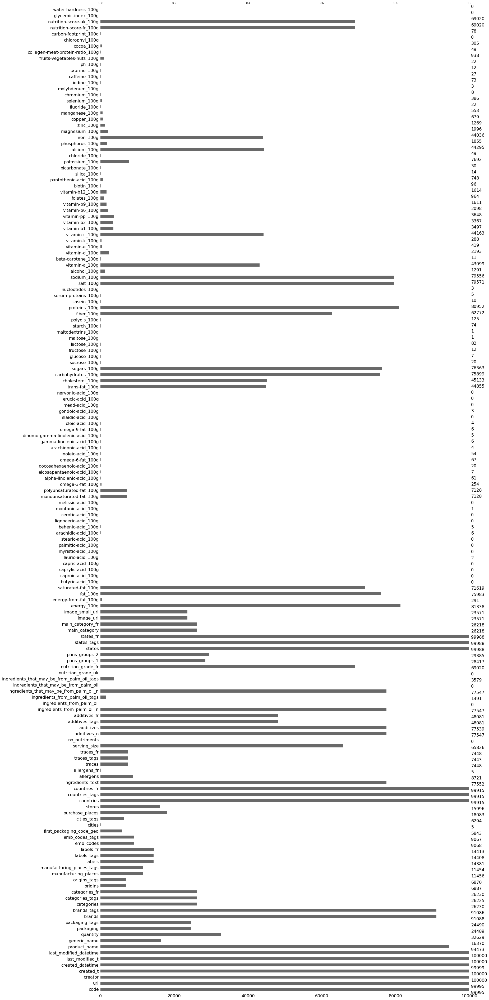

In [21]:
msno.bar(food.sample(100000))

on va essayer d'avoir une vision plus directe du taux de remplissage par variable

In [22]:
taux_remplissage = food.notnull().mean()*100

In [23]:
taux_remplissage = taux_remplissage.sort_values(ascending=False).reset_index()
taux_remplissage.columns = ['Variable','Taux_de_Remplissage']
taux_remplissage

,Variable,Taux_de_Remplissage
0,last_modified_t,100.000000
1,last_modified_datetime,100.000000
2,creator,99.999377
3,created_t,99.999065
4,created_datetime,99.997194
5,code,99.992830
6,url,99.992830
7,states_fr,99.985660
8,states_tags,99.985660
9,states,99.985660


In [24]:
taux_remplissage['Taux_de_Remplissage'].mean()

23.778427368048657

**Représentation graphique du taux de remplissage :**

on va utiliser la moyenne comme seuil de sélection des variables (cela permet d'ailleurs de conserver les features liées aux catégories de produits)

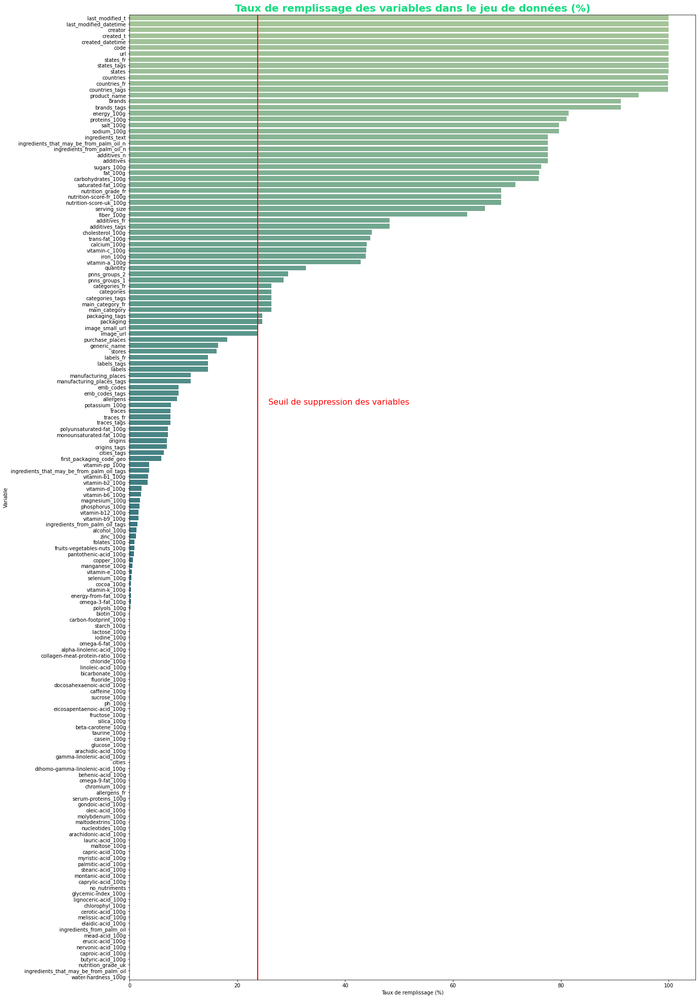

In [25]:
seuil = taux_remplissage['Taux_de_Remplissage'].mean()

fig = plt.figure(figsize=(20, 35))

font_title = {'family': 'DejaVu Sans',
              'color':  '#12db7d',
              'weight': 'bold',
              'size': 20,
             }

sns.barplot(x='Taux_de_Remplissage', y='Variable', data=taux_remplissage, palette="crest")
#Seuil pour suppression des variables
plt.axvline(x=seuil, linewidth=2, color = 'r')
plt.text(seuil+2, 65, 'Seuil de suppression des variables', fontsize = 16, color = 'r')

plt.title("Taux de remplissage des variables dans le jeu de données (%)", fontdict=font_title)
plt.xlabel("Taux de remplissage (%)")
plt.show()

liste des variables à supprimer

In [26]:
var_supp = list(taux_remplissage.loc[taux_remplissage['Taux_de_Remplissage']<seuil, 'Variable'].values)
var_supp

['image_small_url',
 'image_url',
 'purchase_places',
 'generic_name',
 'stores',
 'labels_fr',
 'labels_tags',
 'labels',
 'manufacturing_places',
 'manufacturing_places_tags',
 'emb_codes',
 'emb_codes_tags',
 'allergens',
 'potassium_100g',
 'traces',
 'traces_fr',
 'traces_tags',
 'polyunsaturated-fat_100g',
 'monounsaturated-fat_100g',
 'origins',
 'origins_tags',
 'cities_tags',
 'first_packaging_code_geo',
 'vitamin-pp_100g',
 'ingredients_that_may_be_from_palm_oil_tags',
 'vitamin-b1_100g',
 'vitamin-b2_100g',
 'vitamin-d_100g',
 'vitamin-b6_100g',
 'magnesium_100g',
 'phosphorus_100g',
 'vitamin-b12_100g',
 'vitamin-b9_100g',
 'ingredients_from_palm_oil_tags',
 'alcohol_100g',
 'zinc_100g',
 'folates_100g',
 'fruits-vegetables-nuts_100g',
 'pantothenic-acid_100g',
 'copper_100g',
 'manganese_100g',
 'vitamin-e_100g',
 'selenium_100g',
 'cocoa_100g',
 'vitamin-k_100g',
 'energy-from-fat_100g',
 'omega-3-fat_100g',
 'polyols_100g',
 'biotin_100g',
 'carbon-footprint_100g',
 'sta

In [27]:
len(var_supp)

110

In [28]:
var_conservées = list(taux_remplissage.loc[taux_remplissage['Taux_de_Remplissage']>seuil, 'Variable'].values)
var_conservées

['last_modified_t',
 'last_modified_datetime',
 'creator',
 'created_t',
 'created_datetime',
 'code',
 'url',
 'states_fr',
 'states_tags',
 'states',
 'countries',
 'countries_fr',
 'countries_tags',
 'product_name',
 'brands',
 'brands_tags',
 'energy_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g',
 'ingredients_text',
 'ingredients_that_may_be_from_palm_oil_n',
 'ingredients_from_palm_oil_n',
 'additives_n',
 'additives',
 'sugars_100g',
 'fat_100g',
 'carbohydrates_100g',
 'saturated-fat_100g',
 'nutrition_grade_fr',
 'nutrition-score-fr_100g',
 'nutrition-score-uk_100g',
 'serving_size',
 'fiber_100g',
 'additives_fr',
 'additives_tags',
 'cholesterol_100g',
 'trans-fat_100g',
 'calcium_100g',
 'vitamin-c_100g',
 'iron_100g',
 'vitamin-a_100g',
 'quantity',
 'pnns_groups_2',
 'pnns_groups_1',
 'categories_fr',
 'categories',
 'categories_tags',
 'main_category_fr',
 'main_category',
 'packaging_tags',
 'packaging']

In [29]:
len(var_conservées)

52

Contrôle pour vérifier que l'on a pas perdu de variables lors du traitement

In [30]:
if len(var_supp) + len(var_conservées) == food.shape[1]:
    print('control ok')
else:
    print('control failed')

control ok


**Conversion des colonnes contenant des dates (dtype object) en format date**

In [31]:
food = food[var_conservées].sort_values(["created_datetime","last_modified_datetime"], ascending=True) #False pour avoir les dernières dates en 1er
food.head()

,last_modified_t,last_modified_datetime,creator,created_t,created_datetime,code,url,states_fr,states_tags,states,countries,countries_fr,countries_tags,product_name,brands,brands_tags,energy_100g,proteins_100g,salt_100g,sodium_100g,ingredients_text,ingredients_that_may_be_from_palm_oil_n,ingredients_from_palm_oil_n,additives_n,additives,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,nutrition-score-uk_100g,serving_size,fiber_100g,additives_fr,additives_tags,cholesterol_100g,trans-fat_100g,calcium_100g,vitamin-c_100g,iron_100g,vitamin-a_100g,quantity,pnns_groups_2,pnns_groups_1,categories_fr,categories,categories_tags,main_category_fr,main_category,packaging_tags,packaging
251761,1482511099,2016-12-23T16:38:19Z,stephane,1328021038,2012-01-31T14:43:58Z,3760029248001,http://world-fr.openfoodfacts.org/produit/3760...,"A vérifier,Complet,Informations nutritionnelle...","en:to-be-checked,en:complete,en:nutrition-fact...","en:to-be-checked, en:complete, en:nutrition-fa...",France,France,en:france,Caramels tendres au beurre salé au sel de Guér...,Carabreizh,carabreizh,1717.0,3.0,1.7000,0.669291,"_Lait_ reconstitué en poudre 26% de MG, sirop ...",0.0,0.0,2.0,[ lait-reconstitue-en-poudre-26-de-mg -> fr:l...,49.3,10.9,73.5,7.0,e,28.0,28.0,NaN,NaN,"E500 - Carbonates de sodium,E322 - Lécithines","en:e500,en:e322",NaN,NaN,NaN,NaN,NaN,NaN,100 g,Sweets,Sugary snacks,"Epicerie,Snacks sucrés,Confiseries,Caramels","Epicerie,Snacks sucrés,Confiseries,Caramels","en:groceries,en:sugary-snacks,en:confectioneri...",Epicerie,en:groceries,"boite,carton","Boite,Carton"
188901,1482511099,2016-12-23T16:38:19Z,stephane,1328783696,2012-02-09T10:34:56Z,3029330062806,http://world-fr.openfoodfacts.org/produit/3029...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",France,France,en:france,Jacquet Les bouchées créatives à garnir,Jacquet,jacquet,1898.0,8.5,1.7526,0.690000,"Farine de blé, huile de tournesol, eau, sel, s...",0.0,0.0,1.0,[ farine-de-ble -> fr:farine-de-ble ] [ far...,2.0,15.5,68.0,1.3,c,9.0,9.0,NaN,3.0,E920 - L-Cystéine et ses chlorhydrates,en:e920,NaN,NaN,NaN,NaN,NaN,NaN,54 g,Appetizers,Salty snacks,"Snacks salés,Apéritif,Biscuits apéritifs",Biscuits apéritifs,"en:salty-snacks,en:appetizers,en:crackers",Snacks salés,en:salty-snacks,boite-carton,Boite carton
212131,1459016622,2016-03-26T18:23:42Z,marianne,1328971867,2012-02-11T14:51:07Z,3257980112590,http://world-fr.openfoodfacts.org/produit/3257...,"A vérifier,Complet,Informations nutritionnelle...","en:to-be-checked,en:complete,en:nutrition-fact...","en:to-be-checked, en:complete, en:nutrition-fa...",France,France,en:france,Boudoirs,Cora,cora,1637.0,7.6,0.3810,0.150000,Sucre - farine de blé - œufs frais 25 % - lait...,0.0,0.0,3.0,[ sucre -> fr:sucre ] [ farine-de-ble -> fr...,55.3,3.2,81.0,0.9,d,13.0,13.0,"5,8 g par boudoir (Ce paquet contient 30 boudo...",1.5,"E450i - Pyrophosphate de sodium acide,E500 - C...","en:e450i,en:e500,en:e503",NaN,NaN,NaN,NaN,NaN,NaN,175 g,Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...","Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...","en:sugary-snacks,en:biscuits-and-cakes,en:bisc...",Biscuits,en:biscuits,"boite,carton","Boîte,Carton"
195704,1403887806,2014-06-27T16:50:06Z,stephane,1328986318,2012-02-11T18:51:58Z,3160181210524,http://world-fr.openfoodfacts.org/produit/3160...,"A vérifier,Complet,Informations nutritionnelle...","en:to-be-checked,en:complete,en:nutrition-fact...","en:to-be-checked, en:complete, en:nutrition-fa...",France,France,en:france,Cookies tout chocolat Biocoop,Biocoop,biocoop,2040.0,7.0,0.3810,0.150000,"pépites de chocolat* 30 % (pâte de cacao*, suc...",0.0,1.0,2.0,[ pepites-de-chocolat-30 -> fr:pepites-de-cho...,33.0,25.0,56.0,14.0,e,19.0,19.0,"2 cookies, 33g",5.5,"E322 - Lécithines,E503 - Carbonates d'ammonium","en:e322,en:e503",NaN,NaN,NaN,NaN,Na

*Remarque : le fichier fourni par le lien dans le libellé de l'exercice s'arrête à l'année 2017*

In [32]:
date = food.loc[food['created_t'] == '1474103866']
date

,last_modified_t,last_modified_datetime,creator,created_t,created_datetime,code,url,states_fr,states_tags,states,countries,countries_fr,countries_tags,product_name,brands,brands_tags,energy_100g,proteins_100g,salt_100g,sodium_100g,ingredients_text,ingredients_that_may_be_from_palm_oil_n,ingredients_from_palm_oil_n,additives_n,additives,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,nutrition-score-uk_100g,serving_size,fiber_100g,additives_fr,additives_tags,cholesterol_100g,trans-fat_100g,calcium_100g,vitamin-c_100g,iron_100g,vitamin-a_100g,quantity,pnns_groups_2,pnns_groups_1,categories_fr,categories,categories_tags,main_category_fr,main_category,packaging_tags,packaging
0,1474103893,2016-09-17T09:18:13Z,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,"A compléter,Informations nutritionnelles à com...","en:to-be-completed,en:nutrition-facts-to-be-co...","en:to-be-completed, en:nutrition-facts-to-be-c...",en:FR,France,en:france,Farine de blé noir,Ferme t'y R'nao,ferme-t-y-r-nao,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
food['created_datetime'] = pd.to_datetime(food['created_t'], unit='s', errors='coerce')
food['last_modified_datetime'] = pd.to_datetime(food['last_modified_t'], unit='s', errors='coerce')
food = food.drop(['created_t','last_modified_t'], axis=1)
food.head()

,last_modified_datetime,creator,created_datetime,code,url,states_fr,states_tags,states,countries,countries_fr,countries_tags,product_name,brands,brands_tags,energy_100g,proteins_100g,salt_100g,sodium_100g,ingredients_text,ingredients_that_may_be_from_palm_oil_n,ingredients_from_palm_oil_n,additives_n,additives,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,nutrition-score-uk_100g,serving_size,fiber_100g,additives_fr,additives_tags,cholesterol_100g,trans-fat_100g,calcium_100g,vitamin-c_100g,iron_100g,vitamin-a_100g,quantity,pnns_groups_2,pnns_groups_1,categories_fr,categories,categories_tags,main_category_fr,main_category,packaging_tags,packaging
251761,2016-12-23 16:38:19,stephane,2012-01-31 14:43:58,3760029248001,http://world-fr.openfoodfacts.org/produit/3760...,"A vérifier,Complet,Informations nutritionnelle...","en:to-be-checked,en:complete,en:nutrition-fact...","en:to-be-checked, en:complete, en:nutrition-fa...",France,France,en:france,Caramels tendres au beurre salé au sel de Guér...,Carabreizh,carabreizh,1717.0,3.0,1.7000,0.669291,"_Lait_ reconstitué en poudre 26% de MG, sirop ...",0.0,0.0,2.0,[ lait-reconstitue-en-poudre-26-de-mg -> fr:l...,49.3,10.9,73.5,7.0,e,28.0,28.0,NaN,NaN,"E500 - Carbonates de sodium,E322 - Lécithines","en:e500,en:e322",NaN,NaN,NaN,NaN,NaN,NaN,100 g,Sweets,Sugary snacks,"Epicerie,Snacks sucrés,Confiseries,Caramels","Epicerie,Snacks sucrés,Confiseries,Caramels","en:groceries,en:sugary-snacks,en:confectioneri...",Epicerie,en:groceries,"boite,carton","Boite,Carton"
188901,2016-12-23 16:38:19,stephane,2012-02-09 10:34:56,3029330062806,http://world-fr.openfoodfacts.org/produit/3029...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",France,France,en:france,Jacquet Les bouchées créatives à garnir,Jacquet,jacquet,1898.0,8.5,1.7526,0.690000,"Farine de blé, huile de tournesol, eau, sel, s...",0.0,0.0,1.0,[ farine-de-ble -> fr:farine-de-ble ] [ far...,2.0,15.5,68.0,1.3,c,9.0,9.0,NaN,3.0,E920 - L-Cystéine et ses chlorhydrates,en:e920,NaN,NaN,NaN,NaN,NaN,NaN,54 g,Appetizers,Salty snacks,"Snacks salés,Apéritif,Biscuits apéritifs",Biscuits apéritifs,"en:salty-snacks,en:appetizers,en:crackers",Snacks salés,en:salty-snacks,boite-carton,Boite carton
212131,2016-03-26 18:23:42,marianne,2012-02-11 14:51:07,3257980112590,http://world-fr.openfoodfacts.org/produit/3257...,"A vérifier,Complet,Informations nutritionnelle...","en:to-be-checked,en:complete,en:nutrition-fact...","en:to-be-checked, en:complete, en:nutrition-fa...",France,France,en:france,Boudoirs,Cora,cora,1637.0,7.6,0.3810,0.150000,Sucre - farine de blé - œufs frais 25 % - lait...,0.0,0.0,3.0,[ sucre -> fr:sucre ] [ farine-de-ble -> fr...,55.3,3.2,81.0,0.9,d,13.0,13.0,"5,8 g par boudoir (Ce paquet contient 30 boudo...",1.5,"E450i - Pyrophosphate de sodium acide,E500 - C...","en:e450i,en:e500,en:e503",NaN,NaN,NaN,NaN,NaN,NaN,175 g,Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...","Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...","en:sugary-snacks,en:biscuits-and-cakes,en:bisc...",Biscuits,en:biscuits,"boite,carton","Boîte,Carton"
195704,2014-06-27 16:50:06,stephane,2012-02-11 18:51:58,3160181210524,http://world-fr.openfoodfacts.org/produit/3160...,"A vérifier,Complet,Informations nutritionnelle...","en:to-be-checked,en:complete,en:nutrition-fact...","en:to-be-checked, en:complete, en:nutrition-fa...",France,France,en:france,Cookies tout chocolat Biocoop,Biocoop,biocoop,2040.0,7.0,0.3810,0.150000,"pépites de chocolat* 30 % (pâte de cacao*, suc...",0.0,1.0,2.0,[ pepites-de-chocolat-30 -> fr:pepites-de-cho...,33.0,25.0,56.0,14.0,e,19.0,19.0,"2 cookies, 33g",5.5,"E322 - Lécithines,E503 - Carbonates d'ammonium","en:e322,en:e503",NaN,NaN,NaN,NaN,NaN,NaN,200 g,Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...","Biscuits,Biscuits au cho

Suppression de 2 colonnes en doublon (colonnes en _t) et conversion des 2 autres pour garder date de création et date de modification

Pour info, les noms de colonnes finissant par '_t' sont des dates au format UNIX timestamp (nombre de secondes depuis Jan 1st 1970), ceux finissant par' _datetime' sont au format ISO8601 (yyyy-mm-ddThh:mn:ssZ)

In [34]:
food.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 320772 entries, 251761 to 189417
Data columns (total 50 columns):
 #   Column                                   Non-Null Count   Dtype         
---  ------                                   --------------   -----         
 0   last_modified_datetime                   320749 non-null  datetime64[ns]
 1   creator                                  320770 non-null  object        
 2   created_datetime                         320749 non-null  datetime64[ns]
 3   code                                     320749 non-null  object        
 4   url                                      320749 non-null  object        
 5   states_fr                                320726 non-null  object        
 6   states_tags                              320726 non-null  object        
 7   states                                   320726 non-null  object        
 8   countries                                320492 non-null  object        
 9   countries_fr         

on est passé à 50 variables

**Analyse rapide de la variable 'creator'**

In [35]:
pd.unique(food['creator'])

array(['stephane', 'marianne', 'andre', ..., 'contributer07436362',
       'villecomtal-sur-arros-gers-france',
       'villecomtal-sur-arros-gers-france,saint-just-chaleyssin-isere-france'],
      dtype=object)

In [36]:
len(pd.unique(food['creator']))

3536

sur cette base, nous ne pousserons pas l'analyse plus loin

## Revue des nan values, doublons ...

**Suppression des lignes pour lesquelles toutes les variables numériques (_100g) sont non remplies et donc non exploitables**

In [37]:
import re
pattern=re.compile(r'_100g') 
str_match = [x for x in food.columns if re.search('_100g', x)]
print(str_match)

['energy_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'sugars_100g', 'fat_100g', 'carbohydrates_100g', 'saturated-fat_100g', 'nutrition-score-fr_100g', 'nutrition-score-uk_100g', 'fiber_100g', 'cholesterol_100g', 'trans-fat_100g', 'calcium_100g', 'vitamin-c_100g', 'iron_100g', 'vitamin-a_100g']


In [52]:
# food.dropna(subset=str_match, how='all')
# Traitement abandonné, consommateur de trop de ressources :(
# autre traitement : cf. Suppression des lignes pour lesquelles aucun nutriment (ou nutriScore) n'est rempli

In [39]:
food.shape

(320772, 50)

**Suppression des doublons en fonction du code**

In [40]:
food.drop_duplicates(subset ="code", keep = 'last', inplace=True)

In [41]:
food.shape

(320750, 50)

**Suppression des doublons 'product_name' & 'brands'**

visualisation des doublons

In [42]:
food.loc[food[["product_name","brands"]].duplicated(keep=False),:].sample(10)

,last_modified_datetime,creator,created_datetime,code,url,states_fr,states_tags,states,countries,countries_fr,countries_tags,product_name,brands,brands_tags,energy_100g,proteins_100g,salt_100g,sodium_100g,ingredients_text,ingredients_that_may_be_from_palm_oil_n,ingredients_from_palm_oil_n,additives_n,additives,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,nutrition-score-uk_100g,serving_size,fiber_100g,additives_fr,additives_tags,cholesterol_100g,trans-fat_100g,calcium_100g,vitamin-c_100g,iron_100g,vitamin-a_100g,quantity,pnns_groups_2,pnns_groups_1,categories_fr,categories,categories_tags,main_category_fr,main_category,packaging_tags,packaging
281586,2017-02-07 22:31:21,openfood-ch-import,2017-02-07 22:31:20,5701263902197,http://world-fr.openfoodfacts.org/produit/5701...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",Suisse,Suisse,en:switzerland,NaN,NaN,NaN,1100.0,11.00,2.200000,0.866142,Filets de hareng sans peau (Clupea Harengus) 4...,0.0,0.0,0.0,[ filets-de-hareng-sans-peau -> fr:filets-de-...,20.00,14.00,23.00,3.00,d,18.0,18.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29618,2017-03-09 11:07:13,usda-ndb-import,2017-03-09 11:07:12,0034856121664,http://world-fr.openfoodfacts.org/produit/0034...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,"Fruit Snacks, Mixed Fruit","Welch's, Promotion In Motion Inc.","welch-s,promotion-in-motion-inc",1314.0,0.00,0.099060,0.039000,"Fruit puree (grape, peach, orange, strawberry,...",0.0,0.0,10.0,[ fruit-puree -> en:fruit-puree ] [ puree -...,43.14,0.00,78.43,0.00,d,12.0,12.0,25.5 g (25.5 g),NaN,"E428 - Gélatine,E330 - Acide citrique,E270 - A...","en:e428,en:e330,en:e270,en:e300,en:e331,en:e90...",NaN,0.0,NaN,0.2353,NaN,0.001471,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
17592,2017-03-10 10:49:38,usda-ndb-import,2017-03-10 10:49:38,0021130252794,http://world-fr.openfoodfacts.org/produit/0021...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Seltzer Water,Refreshe,refreshe,0.0,0.00,0.000000,0.000000,Ingredients: carbonated water.,0.0,0.0,0.0,[ ingredients -> en:ingredients ] [ carbona...,0.00,0.00,0.00,NaN,NaN,NaN,NaN,240 ml (8 fl oz),NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
118944,2017-03-09 21:42:50,usda-ndb-import,2017-03-09 21:42:49,0617237991065,http://world-fr.openfoodfacts.org/produit/0617...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Pork & Uncured Bacon Sausage,Big Fork,big-fork,1180.0,12.94,1.612900,0.635000,"Pork, uncured bacon [*no nitrates or nitrites ...",0.0,0.0,0.0,[ pork -> en:pork ] [ uncured-bacon -> en:u...,2.35,22.35,5.88,8.24,d,17.0,17.0,85 g (1 LINK),1.2,NaN,NaN,0.059,0.0,0.212,0.0000,0.00042,0.000176,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
264033,2016-09-24 18:38:43,twoflower,2016-08-22 19:50:47,42208532,http://world-fr.openfoodfacts.org/produit/4220...,"A vérifier,Complet,Informations nutritionnelle...","en:to-be-checked,en:complete,en:nutrition-fact...","en:to-be-checked, en:complete, en:nutrition-fa...","Deutschland,Dänemark","Danemark,Allemagne","en:denmark,en:germany",Ritter Sport Edel-Vollmilch,Ritter Sport,ritter-sport,2356.0,6.50,0.190000,0.074803,"Zucker, Kakaobutter, _Sahnepulver_ (13%), Kaka...",0.0,0.0,1.0,[ zucker -> de:zucker ] [ kakaobutter -> de...,52.00,36.00,52.00,22.00,e,27.0,27.0,NaN,NaN,E322 - Lécithines,en:e322,NaN,NaN,NaN,NaN,NaN,NaN,"16,67 g",Chocolate products,Sugary snacks,"Snacks sucrés,Chocolats

De nombreux doublons sont identifiés, on va vérifier sur qq exemples :

In [43]:
verif_doublons = food.loc[food['product_name'] == 'Sparkle Gel']
verif_doublons

,last_modified_datetime,creator,created_datetime,code,url,states_fr,states_tags,states,countries,countries_fr,countries_tags,product_name,brands,brands_tags,energy_100g,proteins_100g,salt_100g,sodium_100g,ingredients_text,ingredients_that_may_be_from_palm_oil_n,ingredients_from_palm_oil_n,additives_n,additives,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,nutrition-score-uk_100g,serving_size,fiber_100g,additives_fr,additives_tags,cholesterol_100g,trans-fat_100g,calcium_100g,vitamin-c_100g,iron_100g,vitamin-a_100g,quantity,pnns_groups_2,pnns_groups_1,categories_fr,categories,categories_tags,main_category_fr,main_category,packaging_tags,packaging
73818,2017-03-09 09:29:02,usda-ndb-import,2017-03-09 09:29:02,0070896741127,http://world-fr.openfoodfacts.org/produit/0070...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Sparkle Gel,Wilton,wilton,1393.0,0.0,0.0,0.0,"Corn syrup, sugar, water, modified food starch...",0.0,0.0,4.0,[ corn-syrup -> en:corn-syrup ] [ syrup -> ...,50.0,0.0,83.33,NaN,NaN,NaN,NaN,6 g (1 tsp),NaN,"E330 - Acide citrique,E407 - Carraghénanes,E21...","en:e330,en:e407,en:e211,en:e129",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
73728,2017-03-09 09:46:06,usda-ndb-import,2017-03-09 09:46:06,0070896460134,http://world-fr.openfoodfacts.org/produit/0070...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Sparkle Gel,Wilton,wilton,1046.0,0.0,0.0,0.0,"Corn syrup, sugar, water, food starch modified...",0.0,0.0,4.0,[ corn-syrup -> en:corn-syrup ] [ syrup -> ...,50.0,0.0,66.67,NaN,NaN,NaN,NaN,6 g (1 Tbsp),NaN,"E330 - Acide citrique,E407 - Carraghénanes,E21...","en:e330,en:e407,en:e211,en:e133",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
73815,2017-03-09 11:56:00,usda-ndb-import,2017-03-09 11:56:00,0070896741080,http://world-fr.openfoodfacts.org/produit/0070...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Sparkle Gel,Wilton,wilton,1046.0,0.0,0.0,0.0,"Ingredients: corn syrup, sugar, water, modifie...",0.0,0.0,6.0,[ ingredients -> en:ingredients ] [ corn-sy...,50.0,0.0,66.67,NaN,NaN,NaN,NaN,6 g (1 tsp),NaN,"E407 - Carraghénanes,E211 - Benzoate de sodium...","en:e407,en:e211,en:e330,en:e171,en:e102,en:e110",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
73817,2017-03-09 12:47:55,usda-ndb-import,2017-03-09 12:47:55,0070896741110,http://world-fr.openfoodfacts.org/produit/0070...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Sparkle Gel,Wilton,wilton,1393.0,0.0,0.0,0.0,"Corn syrup, sugar, water, food starch-modified...",0.0,0.0,5.0,[ corn-syrup -> en:corn-syrup ] [ syrup -> ...,50.0,0.0,83.33,NaN,NaN,NaN,NaN,6 g (1 tsp),NaN,"E330 - Acide citrique,E407 - Carraghénanes,E21...","en:e330,en:e407,en:e211,en:e102,en:e133",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
73787,2017-03-09 12:47:57,usda-ndb-import,2017-03-09 12:47:57,0070896703569,http://world-fr.openfoodfacts.org/produit/0070...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Sparkle Gel,Wilton,wilton,1046.0,0.0,0.0,0.0,"Corn syrup, sugar, water, food starch-modified...",0.0,0.0,6.0,[ corn-syrup -> en:corn-syrup ] [ syrup -> ...,50.0,0.0,66.67,NaN,NaN,NaN,NaN,6 g (1 tsp),NaN,"E330 - Acide citrique,E407 - Carraghénanes,E21...","en:e330,en:e407,en:e211,en:e127,e

Après revue de qq exemples, on voit qu'en effet il existe de nombreux doublons, ce qui justifie le nb de doublons élevés à supprimer

In [44]:
# Suppression des doublons sur marque et produit en conservant les valeurs nulles
food = food[(~food.duplicated(["product_name","brands"],keep="last")) 
      | ((food['product_name'].isnull()) & (food['brands'].isnull()))] # keep=last (classement par date, on privilégie le dernier élément saisi)

In [45]:
food.shape

(298966, 50)

**Suppression des lignes pour lesquelles aucun nutriment (ou nutriScore) n'est rempli**

In [46]:
def recherche_composant(df, suffixe='_100g'):
  composant = []
  for col in df.columns:
      if '_100g' in col: composant.append(col)
  df_subset_columns = df[composant]
  return df_subset_columns

In [47]:
df_subset_nutriments = recherche_composant(food,'_100g')
df_subset_nutriments.head()

,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,fiber_100g,cholesterol_100g,trans-fat_100g,calcium_100g,vitamin-c_100g,iron_100g,vitamin-a_100g
251761,1717.0,3.0,1.7000,0.669291,49.3,10.9,73.5,7.0,28.0,28.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
188901,1898.0,8.5,1.7526,0.690000,2.0,15.5,68.0,1.3,9.0,9.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN
212131,1637.0,7.6,0.3810,0.150000,55.3,3.2,81.0,0.9,13.0,13.0,1.5,NaN,NaN,NaN,NaN,NaN,NaN
195704,2040.0,7.0,0.3810,0.150000,33.0,25.0,56.0,14.0,19.0,19.0,5.5,NaN,NaN,NaN,NaN,NaN,NaN
302186,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
print('Lignes nutriments (_100g) vides: {}'.format(df_subset_nutriments.isnull().all(axis=1).sum()))

Lignes nutriments (_100g) vides: 55046


In [49]:
food = food[df_subset_nutriments.notnull().any(axis=1)] # on conserve les lignes pour lesquelles au moins un nutriment est renseigné
# inverse de la formule précédente 'all' vs 'any'
food.shape

(243920, 50)

In [51]:
food.sample(5)

,last_modified_datetime,creator,created_datetime,code,url,states_fr,states_tags,states,countries,countries_fr,countries_tags,product_name,brands,brands_tags,energy_100g,proteins_100g,salt_100g,sodium_100g,ingredients_text,ingredients_that_may_be_from_palm_oil_n,ingredients_from_palm_oil_n,additives_n,additives,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,nutrition-score-uk_100g,serving_size,fiber_100g,additives_fr,additives_tags,cholesterol_100g,trans-fat_100g,calcium_100g,vitamin-c_100g,iron_100g,vitamin-a_100g,quantity,pnns_groups_2,pnns_groups_1,categories_fr,categories,categories_tags,main_category_fr,main_category,packaging_tags,packaging
127296,2017-03-10 08:22:26,usda-ndb-import,2017-03-10 08:22:26,0694164003016,http://world-fr.openfoodfacts.org/produit/0694...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Real Eggshell Filled With Hazelnut Chocolate T...,Gut Springenheide,gut-springenheide,2427.0,6.00,0.05080,0.020000,"Sugar, hazelnuts (26,6%), cocoa butter, cocoa ...",0.0,0.0,1.0,[ sugar -> en:sugar ] [ hazelnuts -> en:haz...,48.00,38.00,54.00,14.00,e,22.0,22.0,50 g (1 PIECE),6.0,E322 - Lécithines,en:e322,0.010,0.0,0.080,0.0,0.0036,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19091,2017-03-10 08:53:18,usda-ndb-import,2017-03-10 08:53:18,0021500800129,http://world-fr.openfoodfacts.org/produit/0021...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Truly Instant Brown Gravy Mix,Knorr,knorr,1393.0,0.00,13.54582,5.333000,"Modified corn starch, whey (from milk), maltod...",0.0,0.0,1.0,[ modified-corn-starch -> en:modified-corn-st...,16.67,8.33,66.67,0.00,d,17.0,17.0,6 g (0.25 CUP PREPARED) | (MAKES),0.0,E150a - Caramel E150a,en:e150a,0.000,0.0,0.000,0.0,0.0000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
62274,2017-03-09 21:26:01,usda-ndb-import,2017-03-09 21:26:01,0050754108224,http://world-fr.openfoodfacts.org/produit/0050...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Premium Hickory Smoked Hot Link Sausage,Silva Sausage Company,silva-sausage-company,837.0,14.12,1.88214,0.741000,"Pork, water, non fat dry milk, spices, salt, p...",0.0,0.0,0.0,[ pork -> en:pork ] [ water -> en:water ] ...,2.35,14.12,3.53,5.29,d,14.0,14.0,85 g (1 LINK),1.2,NaN,NaN,0.053,0.0,0.047,0.0,0.0000,0.000071,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
212105,2017-03-03 19:39:20,kiliweb,2017-03-02 13:31:11,3257980095282,http://world-fr.openfoodfacts.org/produit/3257...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",France,France,en:france,Nuggets de poulet,Cora,cora,887.0,15.00,1.10000,0.433071,NaN,NaN,NaN,NaN,NaN,1.30,9.40,16.00,1.70,b,0.0,0.0,NaN,1.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,200 g,Meat,Fish Meat Eggs,"Viandes,Volailles,Poulets,Produits panés,Poule...",Nuggets de poulet,"en:meats,en:poultries,en:chickens,en:breaded-p...",Produits panés,en:breaded-products,carton,carton
138067,2017-03-09 16:22:33,usda-ndb-import,2017-03-09 16:22:33,0737094218300,http://world-fr.openfoodfacts.org/produit/0737...,"A compléter,Informations nutritionnelles compl...","en:to-be-completed,en:nutrition-facts-complete...","en:to-be-completed, en:nutrition-facts-complet...",US,États-Unis,en:united-states,Cayenne Crunch,"The Fresh Market, The Fresh Market Inc.","the-fresh-market,the-fresh-market-inc",2230.0,13.33,1.14300,0.450000,"Hot corn sticks (yellow corn masa, soybean oil...",0.0,0.0,0.0,[ hot-corn-sticks -> en:hot-corn-sticks ] [...,6.67,33.33,46.67,3.33,c,9.0,9.0,30 g (0.25 cup),6.

### features redondantes

states_fr	states_tags	states : on va conserver la colonne states_fr (tx de remplissage identique)

countries	countries_fr	countries_tags : on va conserver la colonne countries_fr (tx de remplissage identique, pas de valeurs non pays à retraiter) => retraitements à prévoir (pls pays dans une mm colonne)

brands	brands_tags : on va conserver la colonne brands

additives_fr	additives_tags : on va conserver la colonne additives_tags : conservation uniquement des codages (retraitement chaine de caractères : supprimer les 'en:'

categories_fr	categories	categories_tags : on va conserver la colonne categories_fr (légèrement mieux remplie)

main_category_fr	main_category : idem on conserve _fr (moins de retraitements)

packaging_tags	packaging : on va conserver la colonne packaging (plus de val. uniques)

In [53]:
pd.unique(food['countries_fr'])

array(['France', 'Pologne', 'Belgique', 'Belgique,France,Suisse',
       'Belgique,France', 'France,Suisse', 'France,Espagne,Suisse', nan,
       'Saint-Pierre-et-Miquelon', 'France,États-Unis', 'Portugal',
       'Belgique,Portugal', 'France,Portugal', 'France,Royaume-Uni',
       'Belgique,France,Maroc,Suisse', 'Maurice', 'France,Allemagne',
       'France,Saint-Pierre-et-Miquelon',
       'Belgique,Danemark,France,Suisse',
       'Belgique,France,Maroc,La Réunion,Suisse',
       'Belgique,Canada,Danemark,France,Allemagne,Maroc,Espagne,Suisse',
       'France,Suisse,Royaume-Uni', 'Suisse',
       'Belgique,Danemark,France,Allemagne', 'France,Allemagne,Suisse',
       'France,Guadeloupe', 'Guadeloupe', 'France,Guadeloupe,Suisse',
       'Danemark,France,Suisse,Magyarorszag,Nagy-britannia,Svajc',
       'Belgique,Danemark,France,Suisse,Royaume-Uni', 'Canada',
       'France,Nouvelle-Calédonie', 'France,Portugal,Espagne',
       'France,Suède', 'France,Belgie',
       'Australie,Belgiqu

Remarque : dans un 1er temps, dans le cadre de nos analyses, nous n'irons pas plus loin dans le retraitement de la variable 'countries' qui ne nous donnent pas d'éléments directs à exploiter pour l'application ou le NutriScore

In [54]:
len(pd.unique(food['packaging']))

11928

In [55]:
features_redond_a_supp = ['states_tags', 'states', 'countries', 'countries_tags', 'brands_tags', 'additives_fr', 'categories', 'categories_tags', 'main_category', 'packaging_tags']

In [56]:
foodSelection = food.drop(['states_tags', 'states', 'countries', 'countries_tags', 'brands_tags', 'additives_fr', 'categories', 'categories_tags', 'main_category', 'packaging_tags'], axis=1)

In [57]:
foodSelection.head()

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,ingredients_text,ingredients_that_may_be_from_palm_oil_n,ingredients_from_palm_oil_n,additives_n,additives,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,nutrition-score-uk_100g,serving_size,fiber_100g,additives_tags,cholesterol_100g,trans-fat_100g,calcium_100g,vitamin-c_100g,iron_100g,vitamin-a_100g,quantity,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr,packaging
251761,2016-12-23 16:38:19,stephane,2012-01-31 14:43:58,3760029248001,http://world-fr.openfoodfacts.org/produit/3760...,"A vérifier,Complet,Informations nutritionnelle...",France,Caramels tendres au beurre salé au sel de Guér...,Carabreizh,1717.0,3.0,1.7000,0.669291,"_Lait_ reconstitué en poudre 26% de MG, sirop ...",0.0,0.0,2.0,[ lait-reconstitue-en-poudre-26-de-mg -> fr:l...,49.3,10.9,73.5,7.0,e,28.0,28.0,NaN,NaN,"en:e500,en:e322",NaN,NaN,NaN,NaN,NaN,NaN,100 g,Sweets,Sugary snacks,"Epicerie,Snacks sucrés,Confiseries,Caramels",Epicerie,"Boite,Carton"
188901,2016-12-23 16:38:19,stephane,2012-02-09 10:34:56,3029330062806,http://world-fr.openfoodfacts.org/produit/3029...,"A compléter,Informations nutritionnelles compl...",France,Jacquet Les bouchées créatives à garnir,Jacquet,1898.0,8.5,1.7526,0.690000,"Farine de blé, huile de tournesol, eau, sel, s...",0.0,0.0,1.0,[ farine-de-ble -> fr:farine-de-ble ] [ far...,2.0,15.5,68.0,1.3,c,9.0,9.0,NaN,3.0,en:e920,NaN,NaN,NaN,NaN,NaN,NaN,54 g,Appetizers,Salty snacks,"Snacks salés,Apéritif,Biscuits apéritifs",Snacks salés,Boite carton
212131,2016-03-26 18:23:42,marianne,2012-02-11 14:51:07,3257980112590,http://world-fr.openfoodfacts.org/produit/3257...,"A vérifier,Complet,Informations nutritionnelle...",France,Boudoirs,Cora,1637.0,7.6,0.3810,0.150000,Sucre - farine de blé - œufs frais 25 % - lait...,0.0,0.0,3.0,[ sucre -> fr:sucre ] [ farine-de-ble -> fr...,55.3,3.2,81.0,0.9,d,13.0,13.0,"5,8 g par boudoir (Ce paquet contient 30 boudo...",1.5,"en:e450i,en:e500,en:e503",NaN,NaN,NaN,NaN,NaN,NaN,175 g,Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Biscuits,"Boîte,Carton"
195704,2014-06-27 16:50:06,stephane,2012-02-11 18:51:58,3160181210524,http://world-fr.openfoodfacts.org/produit/3160...,"A vérifier,Complet,Informations nutritionnelle...",France,Cookies tout chocolat Biocoop,Biocoop,2040.0,7.0,0.3810,0.150000,"pépites de chocolat* 30 % (pâte de cacao*, suc...",0.0,1.0,2.0,[ pepites-de-chocolat-30 -> fr:pepites-de-cho...,33.0,25.0,56.0,14.0,e,19.0,19.0,"2 cookies, 33g",5.5,"en:e322,en:e503",NaN,NaN,NaN,NaN,NaN,NaN,200 g,Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Cookies,"Boîte,Carton"
291384,2014-12-31 03:07:48,andre,2012-02-12 08:51:55,7613031264285,http://world-fr.openfoodfacts.org/produit/7613...,"A vérifier,Complet,Informations nutritionnelle...",Pologne,SMACZNA ZUPA Grochova,"WINIARY,Nestlé",159.0,1.8,1.0160,0.400000,"mąka grochowa (63.6%), grzanki (9.5%) (mąka pr...",0.0,0.0,3.0,[ mąka-grochowa -> pl:mąka-grochowa ] [ 63-...,0.4,0.8,5.5,0.3,c,3.0,3.0,NaN,0.7,"en:e1400,en:e621,en:e635",NaN,NaN,NaN,NaN,NaN,NaN,21 g,unknown,unknown,pl:Soupes-deshydratees,pl:Soupes-deshydratees,Sachet Alu


In [58]:
foodSelection.shape

(243920, 40)

In [59]:
foodSelection.isnull().sum().sort_values(ascending=False)

packaging                                  186321
main_category_fr                           182543
categories_fr                              182542
pnns_groups_1                              178286
pnns_groups_2                              178090
quantity                                   177303
vitamin-a_100g                             117986
iron_100g                                  115356
vitamin-c_100g                             114980
calcium_100g                               114785
trans-fat_100g                             113131
cholesterol_100g                           112268
additives_tags                             105219
fiber_100g                                  57050
serving_size                                51053
nutrition-score-uk_100g                     37742
nutrition_grade_fr                          37742
nutrition-score-fr_100g                     37742
saturated-fat_100g                          30241
additives                                   26457


La feature "packaging" bien que possiblement utile pour un scoring de type eco score est trop peu remplie et non dérivable des autres variables pour être complétées => à supprimer

Les 4 features liées aux catégories sont à conserver et à étudier dans un 1er temps

Feature "Quantity" => à supprimer

"vitamin-a_100g", "iron_100g", "vitamin-c_100g", "calcium_100g", "trans-fat_100g" et "cholesterol_100g" => à supprimer

On ne conservera pas le nutriscore Uk, on n'utilisera que la définition Fr du nutriscore

In [60]:
pd.unique(food['additives'])

array([' [ lait-reconstitue-en-poudre-26-de-mg -> fr:lait-reconstitue-en-poudre-26-de-mg  ]  [ lait-reconstitue-en-poudre-26-de -> fr:lait-reconstitue-en-poudre-26-de  ]  [ lait-reconstitue-en-poudre-26 -> fr:lait-reconstitue-en-poudre-26  ]  [ lait-reconstitue-en-poudre -> fr:lait-reconstitue-en-poudre  ]  [ lait-reconstitue-en -> fr:lait-reconstitue-en  ]  [ lait-reconstitue -> fr:lait-reconstitue  ]  [ lait -> fr:lait  ]  [ sirop-de-glucose -> fr:sirop-de-glucose  ]  [ sirop-de -> fr:sirop-de  ]  [ sirop -> fr:sirop  ]  [ sucre -> fr:sucre  ]  [ beurre-sale-8-5 -> fr:beurre-sale-8-5  ]  [ beurre-sale-8 -> fr:beurre-sale-8  ]  [ beurre-sale -> fr:beurre-sale  ]  [ beurre -> fr:beurre  ]  [ lait -> fr:lait  ]  [ dextrose -> fr:dextrose  ]  [ fleur-de-sel-de-guerande-0-2 -> fr:fleur-de-sel-de-guerande-0-2  ]  [ fleur-de-sel-de-guerande-0 -> fr:fleur-de-sel-de-guerande-0  ]  [ fleur-de-sel-de-guerande -> fr:fleur-de-sel-de-guerande  ]  [ fleur-de-sel-de -> fr:fleur-de-sel-de  ]  [ fleur

"Additives" à supprimer, additives_n à étudier avec additives_tags

"serving_size" à supprimer

In [61]:
pd.unique(food['ingredients_that_may_be_from_palm_oil_n'])

array([ 0.,  1.,  2., nan,  3.,  4.,  5.,  6.])

In [62]:
pd.unique(food['ingredients_from_palm_oil_n'])

array([ 0.,  1.,  2., nan])

le nb d'ingrédients ne donnent pas directement d'infos sur le total huile de palme => impact sur taux de graisses saturées, la feature "saturated_fat" suffira

In [63]:
pd.unique(food['ingredients_text'])

array(['_Lait_ reconstitué en poudre 26% de MG, sirop de glucose, sucre, beurre salé 8.5% (_lait_), dextrose, fleur de sel de Guérande 0.2%, arôme naturel de vanille, poudre à lever : bicarbonate de sodium, émulsifiant : lécithine de _soja_ ',
       'Farine de blé, huile de tournesol, eau, sel, sucre, agent de traitement de la farine : E920.',
       "Sucre - farine de blé - œufs frais 25 % - lait écrémé en poudre - arômes - sel - poudres à lever : diphosphate disodique, carbonate acide de sodium, carbonate acide d'ammonium - dextrose.  ",
       ...,
       'LAIT écrémé réhvdrdé, pâte de cacaot, sucre, sirop de glucose-fructose, eau, huile de coco, cacao maigre en poudrel, beurre de cacaol, sirop de giuccse, BEURRE concentré, LACTOSE et protéines de LAIT, émulsifiants (lécithine de SOJA, E471, E442), LAIT en poudre entier, (E410, E407). Sans gluten, tVérifié RainforestAliianceTM. intense Dark = Noir Intense. Cracking chocolate made With 70% cocca Chocolat craquant 70% de cacao, A con

On utilisera pas la feature "ingredients_text", son exploitation n'apportant pas des informations analysables

In [64]:
foodSelection = foodSelection.drop(['packaging', 'quantity', 'vitamin-a_100g', 'iron_100g', 'vitamin-c_100g', 'calcium_100g', 'trans-fat_100g', 'cholesterol_100g', 'additives', 'serving_size', 'ingredients_that_may_be_from_palm_oil_n', 'ingredients_from_palm_oil_n', 'ingredients_text', 'nutrition-score-uk_100g'], axis=1)

In [65]:
foodSelection.sample(5)

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
196106,2016-01-05 20:31:24,asmoth,2016-01-05 19:40:34,3165441660002,http://world-fr.openfoodfacts.org/produit/3165...,"A vérifier,Complet,Informations nutritionnelle...",France,2 Galettes Jambon Fromage - nouvelle recette,Tipiak,918.0,11.00,1.00000,0.393701,2.0,1.50,14.00,12.00,8.60,d,13.0,1.1,"en:e301,en:e250",unknown,unknown,"Surgelés,Entrées et snacks surgelés,Galettes-f...",Surgelés
174348,2017-03-09 15:03:00,usda-ndb-import,2017-03-09 15:03:00,093534011033,http://world-fr.openfoodfacts.org/produit/0935...,"A compléter,Informations nutritionnelles compl...",États-Unis,"Stichler Products Inc, Christmas Dipped Wafer",Stichler Products Inc.,1623.0,0.00,0.00254,0.001000,3.0,84.85,6.06,84.85,4.55,d,18.0,0.0,"en:e102,en:e133,en:e322",NaN,NaN,NaN,NaN
179058,2017-04-19 18:25:37,openfoodfacts-contributors,2016-07-05 11:42:41,20281151,http://world-fr.openfoodfacts.org/produit/2028...,"A compléter,Informations nutritionnelles compl...",France,Crème brûlée,Milbona,967.0,4.60,0.10000,0.039370,NaN,22.40,13.40,23.10,7.90,d,13.0,NaN,NaN,unknown,unknown,Creme-brulee,Creme-brulee
255646,2017-03-09 13:46:04,usda-ndb-import,2017-03-09 13:46:04,3800018509208,http://world-fr.openfoodfacts.org/produit/3800...,"A compléter,Informations nutritionnelles compl...",États-Unis,Spread,Konex-Tiva,326.0,2.22,1.07188,0.422000,1.0,6.67,4.44,11.11,0.00,a,-1.0,4.4,en:e575,NaN,NaN,NaN,NaN
172828,2017-03-09 12:55:43,usda-ndb-import,2017-03-09 12:55:42,0894771000372,http://world-fr.openfoodfacts.org/produit/0894...,"A compléter,Informations nutritionnelles compl...",États-Unis,"Savory Crisps, Rosemary",34 Degree,1393.0,13.33,3.55600,1.400000,2.0,0.00,0.00,73.33,0.00,c,9.0,6.7,"en:e375,en:e101",NaN,NaN,NaN,NaN


In [66]:
foodSelection.shape

(243920, 26)

**Après ces différentes étapes d'analyse et de retraitements, nous avons retenu 26 variables/features à analyser

In [67]:
foodSelection.isnull().sum().sort_values(ascending=False)

main_category_fr           182543
categories_fr              182542
pnns_groups_1              178286
pnns_groups_2              178090
additives_tags             105219
fiber_100g                  57050
nutrition-score-fr_100g     37742
nutrition_grade_fr          37742
saturated-fat_100g          30241
additives_n                 26435
carbohydrates_100g          18810
fat_100g                    18500
sugars_100g                 16375
sodium_100g                  7061
salt_100g                    7014
brands                       5836
product_name                 3181
proteins_100g                2770
energy_100g                  1645
countries_fr                   67
states_fr                       1
url                             1
code                            1
created_datetime                1
last_modified_datetime          1
creator                         0
dtype: int64

on voit qu'il y a 4 features qui correspondent aux catégories de produits, à creuser

Ces features sont utiles pour calcul du nutriscore et comparaison de produits (pour un projet d'appli proposant des alternatives plus saines; projet d'application non retenu dans cette phase du projet)

**Investigation de la valeur nulle dans les colonnes dates**

In [68]:
foodSelection.loc[foodSelection['created_datetime'].isna()]

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
189417,NaT,villecomtal-sur-arros-gers-france,NaT,NaN,NaN,NaN,en:fruit-yogurts,France,NaN,NaN,0.158,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN


In [69]:
foodSelection = foodSelection.dropna(axis=0, subset=['created_datetime'])

Suppression de la ligne identifiée non exploitable

In [70]:
foodSelection.isnull().sum().sort_values(ascending=False)

main_category_fr           182542
categories_fr              182542
pnns_groups_1              178285
pnns_groups_2              178089
additives_tags             105218
fiber_100g                  57049
nutrition-score-fr_100g     37741
nutrition_grade_fr          37741
saturated-fat_100g          30240
additives_n                 26434
carbohydrates_100g          18809
fat_100g                    18499
sugars_100g                 16374
sodium_100g                  7060
salt_100g                    7013
brands                       5835
product_name                 3181
proteins_100g                2770
energy_100g                  1644
countries_fr                   67
creator                         0
states_fr                       0
url                             0
code                            0
created_datetime                0
last_modified_datetime          0
dtype: int64

## val aberrantes

pour chq feature de type '_100g', la valeur ne doit pas dépasser 100g ou présenter des valeurs négatives, supprimer sinon

infos complémentaires :

saturated-fat (ou trans fat ou cholesterol) < fat

sugars < carbohydrates

sodium < salt

In [71]:
foodSelectionE = foodSelection.loc[foodSelection['energy_100g'] > 3700 ]

In [72]:
foodSelectionE.sample(5)

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
44740,2017-03-10 08:24:34,usda-ndb-import,2017-03-10 08:24:34,0041318280449,http://world-fr.openfoodfacts.org/produit/0041...,"A compléter,Informations nutritionnelles compl...",États-Unis,100% Organic Coconut Oil,Schnucks,3887.0,0.0,0.00,0.000000,0.0,0.0,100.0,0.0,85.71,e,20.0,0.0,NaN,NaN,NaN,NaN,NaN
304297,2017-02-23 11:28:53,kiliweb,2017-02-23 11:28:53,8016857024016,http://world-fr.openfoodfacts.org/produit/8016...,"A compléter,Informations nutritionnelles compl...",France,Gnocchi E Pasta Fresca,Stroppa,4828.0,9.8,1.12,0.440945,NaN,1.9,NaN,NaN,3.52,d,14.0,2.3,NaN,NaN,NaN,NaN,NaN
179179,2017-02-19 13:55:36,kiliweb,2017-02-19 13:55:35,2030502431284,http://world-fr.openfoodfacts.org/produit/2030...,"A compléter,Informations nutritionnelles compl...",France,Lot De 4 Baguettes,Auchan,4184.0,0.0,0.00,0.000000,NaN,0.0,NaN,NaN,0.00,c,10.0,0.0,NaN,NaN,NaN,NaN,NaN
6712,2017-03-09 12:18:24,usda-ndb-import,2017-03-09 12:18:24,0011152265537,http://world-fr.openfoodfacts.org/produit/0011...,"A compléter,Informations nutritionnelles compl...",États-Unis,"Premium Sesame Oil, Hot","Dynasty, Jfc International Inc.",3887.0,0.0,0.00,0.000000,0.0,0.0,100.0,0.0,14.29,e,20.0,0.0,NaN,NaN,NaN,NaN,NaN
264465,2017-02-17 13:30:46,adi190212,2017-02-17 13:17:19,4260042260053,http://world-fr.openfoodfacts.org/produit/4260...,"A compléter,Informations nutritionnelles compl...",Allemagne,Original Ayurveda Ghee,Finck Naturkost,3853.0,0.0,0.00,0.000000,0.0,0.0,99.7,0.0,0.00,c,10.0,0.0,NaN,unknown,unknown,en:Ghee,en:Ghee


In [73]:
foodSelectionE.shape

(598, 26)

In [74]:
contain_values = foodSelectionE[foodSelectionE['product_name'].str.contains('Isio', na=False)]
contain_values

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
217576,2017-02-20 21:18:55,openfoodfacts-contributors,2016-09-18 10:49:24,3265477983004,http://world-fr.openfoodfacts.org/produit/3265...,"A compléter,Informations nutritionnelles compl...",France,Huile d'olive Isio 4,Lesieur,3766.0,0.0,0.0,0.0,NaN,0.0,NaN,NaN,9.0,d,18.0,0.0,NaN,NaN,NaN,NaN,NaN


In [75]:
foodSelection.drop(foodSelection[foodSelection['energy_100g'] > 3700].index, inplace = True)

In [76]:
foodSelection.shape

(243321, 26)

In [77]:
foodSelection.drop(foodSelection[foodSelection['energy_100g'] < 0].index, inplace = True)

In [78]:
foodSelection.shape

(243321, 26)

In [79]:
foodSelection.sort_values(by=['energy_100g'], ascending=False).iloc[:50]

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
203410,2015-12-21 13:54:29,sebleouf,2015-12-11 17:28:59,3245270001440,http://world-fr.openfoodfacts.org/produit/3245...,"A vérifier,Complet,Informations nutritionnelle...",France,Huile de colza fruitée aux noix,"Sans marque,Huilerie Croix Verte",3700.0,0.0,0.0000,0.000000,0.0,0.0,100.0,0.0,7.0,c,10.0,NaN,NaN,Fats,Fat and sauces,"Aliments et boissons à base de végétaux,Alimen...",Huiles
203408,2016-05-15 09:34:47,tacite,2016-05-14 19:21:28,3245270001358,http://world-fr.openfoodfacts.org/produit/3245...,"A vérifier,Complet,Informations nutritionnelle...",France,Huile La Quotidienne Cuisson & Assaisonnement ...,La Tourangelle,3700.0,0.0,0.0000,0.000000,0.0,0.0,100.0,0.0,10.0,d,11.0,NaN,NaN,Fats,Fat and sauces,"Aliments et boissons à base de végétaux,Alimen...",Huiles
306835,2015-01-25 13:29:56,openfoodfacts-contributors,2015-01-24 18:18:57,8410179003498,http://world-fr.openfoodfacts.org/produit/8410...,"A vérifier,Complet,Informations nutritionnelle...",France,Optima,Tramier,3700.0,0.0,NaN,NaN,0.0,NaN,100.0,0.0,10.0,NaN,NaN,NaN,NaN,Fats,Fat and sauces,"Aliments et boissons à base de végétaux,Alimen...",Huiles d'olive
247038,2017-01-02 14:57:52,tacinte,2015-12-12 14:33:54,3596710418152,http://world-fr.openfoodfacts.org/produit/3596...,"A vérifier,Complet,Informations nutritionnelle...",France,Huile d'Olive Vierge Extra,Auchan,3700.0,0.0,0.0000,0.000000,0.0,0.0,100.0,0.0,15.0,d,11.0,NaN,NaN,Fats,Fat and sauces,"Aliments et boissons à base de végétaux,Alimen...",Huiles d'olive
217538,2016-09-21 15:50:58,date-limite-app,2015-01-18 11:55:14,3265474015005,http://world-fr.openfoodfacts.org/produit/3265...,"A vérifier,Complet,Informations nutritionnelle...",France,Cœur de Tournesol (Offre Saisonnière),"Lesieur,Groupe Avril",3700.0,0.0,0.0000,0.000000,0.0,0.0,100.0,0.0,11.0,d,11.0,NaN,NaN,Fats,Fat and sauces,"Aliments et boissons à base de végétaux,Alimen...",Huiles
311965,2013-09-02 17:12:04,sebleouf,2013-08-31 13:01:36,8480017348234,http://world-fr.openfoodfacts.org/produit/8480...,"A vérifier,Complet,Informations nutritionnelle...",France,Huile de colza,Dia,3700.0,0.0,0.0000,0.000000,0.0,0.0,100.0,0.0,8.0,c,10.0,0.0,NaN,Fats,Fat and sauces,"Aliments et boissons à base de végétaux,Alimen...",Huiles
234019,2016-05-08 18:41:02,sebleouf,2016-05-07 10:31:21,3452016210206,http://world-fr.openfoodfacts.org/produit/3452...,"A vérifier,Complet,Informations nutritionnelle...",France,Huile vierge de noix,Vigean,3700.0,0.0,NaN,NaN,0.0,NaN,100.0,0.0,9.0,NaN,NaN,NaN,NaN,Fats,Fat and sauces,"Aliments et boissons à base de végétaux,Alimen...",Huiles
278724,2015-02-27 13:59:52,big-brother,2015-01-09 07:04:07,5410803850170,http://world-fr.openfoodfacts.org/produit/5410...,"A vérifier,Complet,Informations nutritionnelle...",France,Sauce pimentée pour pizza,Colona,3700.0,0.0,NaN,NaN,0.0,0.0,100.0,0.0,7.7,NaN,NaN,0.0,NaN,Dressings and sauces,Fat and sauces,"Epicerie,Sauces",Epicerie
311820,2015-01-08 16:38:06,javichu,2015-01-08 16:31:35,8480017123602,http://world-fr.openfoodfacts.org/produit/8480...,"A vérifier,Complet,Informations nutritionnelle...",Espagne,Aceite de oliva virgen extra &quot;Dia&quot;,"Dia, //Propiedad de://, Dia - Distribuidora In...",3700.0,0.0,NaN,NaN,0.0,NaN,100.0,0.0,14.5,NaN,NaN,NaN,NaN,Fats,Fat and sauces,"Aliments et boissons à base de végétaux,Alimen...",Huiles d'olive
317879,2017-04-14 22:07:29,openfoodfacts-contributors,2017-03-19 10:42:20,9001466207911,http://world-fr.openfoodfacts.org/produit/9001...,"A compléter,Informations nutritionnelles compl...",Allemagne,NaN,Rapso,3700.0,0.0,0.0000,0.000000,NaN,0.0,100.0,0.0,6.0,c,10.0,NaN,NaN,Fats,Fat and sauces,"Aliments et boissons à base de

In [ ]:
# food.sort_values(by=['energy_100g'], ascending=False).iloc[:500]

# supprimer toutes les lignes dont la valeur est supérieure à 3700kj (val max possible)
# voir si possible de recalculer la valeur energetique sur la base des valeurs prot, carb fat (étape abandonnée à ce stade du projet)

In [80]:
variables_nutriments_100g = ['proteins_100g','salt_100g', 'sodium_100g', 'sugars_100g', 'fat_100g','carbohydrates_100g',
                       'saturated-fat_100g','fiber_100g']
foodSelection_cleaned = foodSelection[~(foodSelection[variables_nutriments_100g] > 100).any(axis=1)]

In [81]:
foodSelection_cleaned.shape

(243158, 26)

In [82]:
foodSelection_cleaned = foodSelection_cleaned[~(foodSelection_cleaned[variables_nutriments_100g] < 0).any(axis=1)]

In [83]:
foodSelection_cleaned.sample(5)

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
254620,2017-03-23 13:24:54,openfoodfacts-contributors,2015-05-30 14:26:48,3760195900246,http://world-fr.openfoodfacts.org/produit/3760...,"A vérifier,Complet,Informations nutritionnelle...",France,Pur jus de pomme bio Juliet,"Les Jardins de l'Orbrie,Coeur de Pom",189.0,0.0455,0.00441,0.001740,0.0,NaN,0.0909,10.90,NaN,NaN,NaN,NaN,NaN,Fruit juices,Beverages,"Aliments et boissons à base de végétaux,Boisso...",Jus de pomme
194720,2016-07-14 15:51:29,ninie,2016-07-14 09:25:06,311900330047,http://world-fr.openfoodfacts.org/produit/3119...,"A compléter,Informations nutritionnelles compl...",France,Crosti oz miel,Joseph favrichon,1635.0,6.5000,0.80000,0.314961,NaN,18.0,2.5000,82.00,0.6,b,1.0,4.7,NaN,Breakfast cereals,Cereals and potatoes,"Aliments et boissons à base de végétaux,Alimen...",Petit-déjeuners
223965,2017-02-19 19:54:42,kiliweb,2017-02-19 19:54:42,3299430030498,http://world-fr.openfoodfacts.org/produit/3299...,"A compléter,Informations nutritionnelles compl...",France,Confiture Figue,Saveurs Attitudes,920.0,0.8000,0.00200,0.000787,NaN,51.8,NaN,NaN,0.0,d,11.0,1.2,NaN,NaN,NaN,NaN,NaN
146286,2017-03-09 13:28:55,usda-ndb-import,2017-03-09 13:28:55,0789293900050,http://world-fr.openfoodfacts.org/produit/0789...,"A compléter,Informations nutritionnelles compl...",États-Unis,"Serpis, Sabores Green Olives Stuffed With Tuna",Candido Miro,837.0,0.0000,4.06400,1.600000,2.0,NaN,20.0000,6.67,0.0,NaN,NaN,NaN,"en:e401,en:e621",NaN,NaN,NaN,NaN
264252,2016-02-13 11:38:12,hangy,2015-10-11 09:06:07,4250085759331,http://world-fr.openfoodfacts.org/produit/4250...,"A vérifier,Complet,Informations nutritionnelle...",Allemagne,Bio Vollkorn Spiralen,GLÜX,1508.0,12.5000,0.00500,0.001969,0.0,3.5,1.5000,73.00,0.2,a,-1.0,NaN,NaN,Cereals,Cereals and potatoes,"Aliments et boissons à base de végétaux,Alimen...",Pâtes alimentaires


In [84]:
foodSelection_cleaned.shape

(243147, 26)

In [85]:
foodSelection_cleaned = foodSelection_cleaned[~((foodSelection_cleaned['saturated-fat_100g'] > foodSelection_cleaned['fat_100g']) 
                                | (foodSelection_cleaned['sodium_100g'] > foodSelection_cleaned['salt_100g'])
                                | (foodSelection_cleaned['sugars_100g'] > foodSelection_cleaned['carbohydrates_100g']))]

In [86]:
foodSelectionTestFat = foodSelection_cleaned.loc[foodSelection_cleaned['saturated-fat_100g'] > foodSelection_cleaned['fat_100g']]
foodSelectionTestFat

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr


In [87]:
foodSelectionTestFat.shape

(0, 26)

In [88]:
foodSelection_cleaned.shape

(242166, 26)

In [89]:
foodSelection_cleaned.sort_values(by=['fiber_100g'], ascending=False).iloc[:50]

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
157446,2017-03-09 13:46:10,usda-ndb-import,2017-03-09 13:46:10,0850196003060,http://world-fr.openfoodfacts.org/produit/0850...,"A compléter,Informations nutritionnelles compl...",États-Unis,Powdered Sweetener Packets,Pyure,0.0,0.00,0.00000,0.000000,0.0,0.00,0.00,100.00,NaN,NaN,NaN,100.00,NaN,NaN,NaN,NaN,NaN
127525,2017-03-30 19:35:35,kiliweb,2017-03-30 19:35:35,0698502500571,http://world-fr.openfoodfacts.org/produit/0698...,"A compléter,Informations nutritionnelles compl...",France,Savarez - Jeu De Cordes,Savarez,4.0,100.00,0.00000,0.000000,NaN,0.10,NaN,NaN,0.10,a,-10.0,100.00,NaN,NaN,NaN,NaN,NaN
285429,2017-02-21 17:48:02,kiliweb,2017-02-21 17:48:02,7340055304214,http://world-fr.openfoodfacts.org/produit/7340...,"A compléter,Informations nutritionnelles compl...",France,Marshall - Major Noir,Sony,21.0,100.00,50.00000,19.685039,NaN,5.00,NaN,NaN,5.00,c,10.0,100.00,NaN,NaN,NaN,NaN,NaN
283105,2017-02-21 17:31:44,kiliweb,2017-02-21 17:31:42,6091035082004,http://world-fr.openfoodfacts.org/produit/6091...,"A compléter,Informations nutritionnelles compl...",France,Eau,Vital,418.0,100.00,2.00000,0.787402,NaN,100.00,NaN,NaN,100.00,e,24.0,100.00,NaN,NaN,NaN,NaN,NaN
86625,2017-03-10 11:00:31,usda-ndb-import,2017-03-10 11:00:31,0074410530525,http://world-fr.openfoodfacts.org/produit/0074...,"A compléter,Informations nutritionnelles compl...",États-Unis,"Yamashin, Powdered Agar-Agar",Wismettac Asian Foods Inc.,1046.0,0.00,0.63500,0.250000,0.0,0.00,0.00,75.00,0.00,b,0.0,100.00,NaN,NaN,NaN,NaN,NaN
10504,2017-03-09 12:46:23,usda-ndb-import,2017-03-09 12:46:23,0012511946067,http://world-fr.openfoodfacts.org/produit/0012...,"A compléter,Informations nutritionnelles compl...",États-Unis,Sweeteners,Wholesome,0.0,0.00,0.00000,0.000000,1.0,NaN,0.00,100.00,NaN,NaN,NaN,100.00,en:e551,NaN,NaN,NaN,NaN
157447,2017-03-09 12:06:21,usda-ndb-import,2017-03-09 12:06:20,0850196003091,http://world-fr.openfoodfacts.org/produit/0850...,"A compléter,Informations nutritionnelles compl...",États-Unis,"Premium Organic Stevia, Powdered Sweetener Pac...",Pyure,0.0,0.00,0.00000,0.000000,0.0,0.00,0.00,100.00,NaN,NaN,NaN,100.00,NaN,NaN,NaN,NaN,NaN
170118,2017-04-07 13:46:29,kiliweb,2017-03-24 19:23:33,0883929140886,http://world-fr.openfoodfacts.org/produit/0883...,"A compléter,Informations nutritionnelles compl...",France,Harry Potter & The Deathly Hallows Radcliffe /...,Harry's,4.0,100.00,0.00000,0.000000,NaN,0.00,NaN,NaN,0.00,a,-10.0,100.00,NaN,unknown,unknown,Non alimentaire,Non alimentaire
273543,2017-03-24 19:22:13,kiliweb,2017-03-24 19:22:13,5051889553625,http://world-fr.openfoodfacts.org/produit/5051...,"A compléter,Informations nutritionnelles compl...",France,Le Hobbit : La Bataille Des Cinq Armés - Versi...,Blu Ray,4.0,100.00,0.00000,0.000000,NaN,0.00,NaN,NaN,0.00,a,-10.0,100.00,NaN,NaN,NaN,NaN,NaN
244661,2017-04-17 15:10:22,kiliweb,2017-04-17 15:10:20,3590670000174,http://world-fr.openfoodfacts.org/produit/3590...,"A compléter,Informations nutritionnelles compl...",France,Noix sèches,Pepinoix,0.0,0.00,0.00000,0.000000,0.0,0.00,0.00,0.00,0.00,a,-5.0,100.00,NaN,unknown,unknown,NaN,NaN


In [90]:
foodSelectionTest = foodSelection_cleaned.loc[foodSelection_cleaned['salt_100g'] > 100 ]

In [91]:
foodSelectionTest.head()

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr


**on va vérifier si tous les  noms de produits sont renseignés**

In [92]:
product_na = foodSelection_cleaned.loc[foodSelection_cleaned['product_name'].isna()]
product_na

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
187457,2016-01-14 12:57:14,lilimarti,2012-05-17 18:30:30,3017760000192,http://world-fr.openfoodfacts.org/produit/3017...,"A compléter,Informations nutritionnelles compl...",NaN,NaN,NaN,1850.00,8.00,1.400000,0.551181,3.0,23.00,12.000,73.00,7.600,e,19.0,3.00,"en:e500,en:e503,en:e330",unknown,unknown,NaN,NaN
305460,2014-01-30 22:39:02,julienbalas,2012-11-14 21:31:58,80667681,http://world-fr.openfoodfacts.org/produit/8066...,"A compléter,Informations nutritionnelles compl...",France,NaN,nature med,224.50,2.50,NaN,NaN,0.0,2.20,0.000,10.20,NaN,NaN,NaN,NaN,NaN,Sweets,Sugary snacks,"Snacks sucrés,Confiseries,Bonbons,Reglisse",Bonbons
3973,2017-03-09 12:46:33,openfoodfacts-contributors,2012-11-28 08:21:03,0011110856050,http://world-fr.openfoodfacts.org/produit/0011...,"A compléter,Informations nutritionnelles compl...",États-Unis,NaN,Kroger,3586.00,0.00,0.000000,0.000000,NaN,NaN,100.000,0.00,14.290,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
300084,2017-03-10 08:07:26,stephane,2013-02-06 12:40:19,7771711000506,http://world-fr.openfoodfacts.org/produit/7771...,"A compléter,Informations nutritionnelles compl...","France,États-Unis",NaN,El Ceibo,2343.00,12.50,1.016000,0.400000,NaN,NaN,32.500,52.50,12.500,NaN,NaN,NaN,NaN,unknown,unknown,NaN,NaN
283147,2017-03-13 20:52:53,siggg,2013-02-23 17:08:35,6111018600039,http://world-fr.openfoodfacts.org/produit/6111...,"A compléter,Informations nutritionnelles compl...",France,NaN,"Maggi,Nestlé",169.00,1.50,0.760000,0.299213,NaN,1.40,0.800,6.40,0.400,NaN,NaN,0.80,NaN,One-dish meals,Composite foods,"Produits déshydratés,Plats préparés,Produits l...",Soupes
64770,2017-03-10 10:27:40,hobbes,2013-04-15 13:01:14,0052603090704,http://world-fr.openfoodfacts.org/produit/0052...,"A compléter,Informations nutritionnelles compl...","Costa Rica,États-Unis",NaN,"Pacific, Pacific Foods Of Oregon Inc.",230.00,0.42,0.063500,0.025000,NaN,5.92,0.850,11.41,0.000,b,1.0,0.00,NaN,NaN,NaN,NaN,NaN
282634,2017-02-07 20:30:51,openfoodfacts-contributors,2013-04-22 17:08:24,5997523324292,http://world-fr.openfoodfacts.org/produit/5997...,"A compléter,Informations nutritionnelles compl...","France,Suisse",NaN,NaN,812.00,4.40,1.500000,0.590551,NaN,4.10,7.800,25.50,3.800,d,11.0,NaN,NaN,unknown,unknown,NaN,NaN
220654,2017-03-31 09:37:07,openfoodfacts-contributors,2013-04-25 11:35:56,3272770094641,http://world-fr.openfoodfacts.org/produit/3272...,"A compléter,Informations nutritionnelles compl...",France,NaN,NaN,NaN,NaN,0.914400,0.360000,NaN,3.20,8.000,4.50,5.400,NaN,NaN,1.30,NaN,unknown,unknown,NaN,NaN
221535,2017-04-11 20:51:28,openfoodfacts-contributors,2013-05-01 18:00:40,3276170018818,http://world-fr.openfoodfacts.org/produit/3276...,"A compléter,Informations nutritionnelles compl...",France,NaN,NaN,485.00,8.30,1.930400,0.760000,NaN,1.80,4.400,10.40,0.350,c,4.0,0.50,NaN,unknown,unknown,NaN,NaN
178254,2013-06-26 07:07:47,tetchos,2013-06-25 09:08:56,20151720,http://world-fr.openfoodfacts.org/produit/2015...,"A compléter,Informations nutritionnelles compl...",Belgique,NaN,NaN,2367.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,NaN,NaN


In [93]:
product_na.shape

(3155, 26)

In [94]:
foodSelection_cleaned = foodSelection_cleaned.dropna(axis=0, subset=['product_name'])

les lignes correspondantes sont supprimées

In [95]:
foodSelection_cleaned.head()

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
251761,2016-12-23 16:38:19,stephane,2012-01-31 14:43:58,3760029248001,http://world-fr.openfoodfacts.org/produit/3760...,"A vérifier,Complet,Informations nutritionnelle...",France,Caramels tendres au beurre salé au sel de Guér...,Carabreizh,1717.0,3.0,1.7000,0.669291,2.0,49.3,10.9,73.5,7.0,e,28.0,NaN,"en:e500,en:e322",Sweets,Sugary snacks,"Epicerie,Snacks sucrés,Confiseries,Caramels",Epicerie
188901,2016-12-23 16:38:19,stephane,2012-02-09 10:34:56,3029330062806,http://world-fr.openfoodfacts.org/produit/3029...,"A compléter,Informations nutritionnelles compl...",France,Jacquet Les bouchées créatives à garnir,Jacquet,1898.0,8.5,1.7526,0.690000,1.0,2.0,15.5,68.0,1.3,c,9.0,3.0,en:e920,Appetizers,Salty snacks,"Snacks salés,Apéritif,Biscuits apéritifs",Snacks salés
212131,2016-03-26 18:23:42,marianne,2012-02-11 14:51:07,3257980112590,http://world-fr.openfoodfacts.org/produit/3257...,"A vérifier,Complet,Informations nutritionnelle...",France,Boudoirs,Cora,1637.0,7.6,0.3810,0.150000,3.0,55.3,3.2,81.0,0.9,d,13.0,1.5,"en:e450i,en:e500,en:e503",Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Biscuits
195704,2014-06-27 16:50:06,stephane,2012-02-11 18:51:58,3160181210524,http://world-fr.openfoodfacts.org/produit/3160...,"A vérifier,Complet,Informations nutritionnelle...",France,Cookies tout chocolat Biocoop,Biocoop,2040.0,7.0,0.3810,0.150000,2.0,33.0,25.0,56.0,14.0,e,19.0,5.5,"en:e322,en:e503",Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Cookies
291384,2014-12-31 03:07:48,andre,2012-02-12 08:51:55,7613031264285,http://world-fr.openfoodfacts.org/produit/7613...,"A vérifier,Complet,Informations nutritionnelle...",Pologne,SMACZNA ZUPA Grochova,"WINIARY,Nestlé",159.0,1.8,1.0160,0.400000,3.0,0.4,0.8,5.5,0.3,c,3.0,0.7,"en:e1400,en:e621,en:e635",unknown,unknown,pl:Soupes-deshydratees,pl:Soupes-deshydratees


In [96]:
foodSelection_cleaned.shape

(239011, 26)

## Retraitements sur les données liées aux additifs

nettoyage des caractères en surplus ('en:', indicateur de la langue)

In [97]:
foodSelection_cleaned['additives_tags'] = foodSelection_cleaned['additives_tags'].str.replace('en:', '', regex=True)

In [98]:
foodSelection_cleaned['additives_tags'].head()

251761          e500,e322
188901               e920
212131    e450i,e500,e503
195704          e322,e503
291384    e1400,e621,e635
Name: additives_tags, dtype: object

In [99]:
foodSelection_cleaned.head()

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,additives_n,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr
251761,2016-12-23 16:38:19,stephane,2012-01-31 14:43:58,3760029248001,http://world-fr.openfoodfacts.org/produit/3760...,"A vérifier,Complet,Informations nutritionnelle...",France,Caramels tendres au beurre salé au sel de Guér...,Carabreizh,1717.0,3.0,1.7000,0.669291,2.0,49.3,10.9,73.5,7.0,e,28.0,NaN,"e500,e322",Sweets,Sugary snacks,"Epicerie,Snacks sucrés,Confiseries,Caramels",Epicerie
188901,2016-12-23 16:38:19,stephane,2012-02-09 10:34:56,3029330062806,http://world-fr.openfoodfacts.org/produit/3029...,"A compléter,Informations nutritionnelles compl...",France,Jacquet Les bouchées créatives à garnir,Jacquet,1898.0,8.5,1.7526,0.690000,1.0,2.0,15.5,68.0,1.3,c,9.0,3.0,e920,Appetizers,Salty snacks,"Snacks salés,Apéritif,Biscuits apéritifs",Snacks salés
212131,2016-03-26 18:23:42,marianne,2012-02-11 14:51:07,3257980112590,http://world-fr.openfoodfacts.org/produit/3257...,"A vérifier,Complet,Informations nutritionnelle...",France,Boudoirs,Cora,1637.0,7.6,0.3810,0.150000,3.0,55.3,3.2,81.0,0.9,d,13.0,1.5,"e450i,e500,e503",Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Biscuits
195704,2014-06-27 16:50:06,stephane,2012-02-11 18:51:58,3160181210524,http://world-fr.openfoodfacts.org/produit/3160...,"A vérifier,Complet,Informations nutritionnelle...",France,Cookies tout chocolat Biocoop,Biocoop,2040.0,7.0,0.3810,0.150000,2.0,33.0,25.0,56.0,14.0,e,19.0,5.5,"e322,e503",Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Cookies
291384,2014-12-31 03:07:48,andre,2012-02-12 08:51:55,7613031264285,http://world-fr.openfoodfacts.org/produit/7613...,"A vérifier,Complet,Informations nutritionnelle...",Pologne,SMACZNA ZUPA Grochova,"WINIARY,Nestlé",159.0,1.8,1.0160,0.400000,3.0,0.4,0.8,5.5,0.3,c,3.0,0.7,"e1400,e621,e635",unknown,unknown,pl:Soupes-deshydratees,pl:Soupes-deshydratees


In [100]:
foodSelection_cleaned.shape

(239011, 26)

In [101]:
foodSelection_cleaned['additives_tags'].sample(10)

214231                  e14xx,e412
236463                   e252,e301
284146                         NaN
39462                    e251,e250
28982     e415,e211,e201,e223,e330
296449                   e341,e407
9260              e375,e101,e500ii
159094                        e338
96149              e375,e322,e160a
191273         e440,e414,e904,e322
Name: additives_tags, dtype: object

définition du nb d'additifs à partir des tags remplis

In [102]:
foodSelection_cleaned['additives_n2'] = foodSelection_cleaned['additives_tags'].astype(str).apply(lambda n: len(n.split(',')))

comparaison du nb d'additifs entre nb saisi et nb recalculé

In [103]:
additives_check = foodSelection_cleaned[['additives_n','additives_n2']]

In [104]:
additives_check.head()

,additives_n,additives_n2
251761,2.0,2
188901,1.0,1
212131,3.0,3
195704,2.0,2
291384,3.0,3


In [105]:
additives_check['additives_ecart'] = additives_check['additives_n'] - additives_check['additives_n2']

C:\Users\laure\AppData\Local\Temp/ipykernel_13912/1100566539.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  additives_check['additives_ecart'] = additives_check['additives_n'] - additives_check['additives_n2']


In [106]:
additives_check.head()

,additives_n,additives_n2,additives_ecart
251761,2.0,2,0.0
188901,1.0,1,0.0
212131,3.0,3,0.0
195704,2.0,2,0.0
291384,3.0,3,0.0


In [107]:
additives_check.shape

(239011, 3)

In [108]:
additives_check = additives_check.loc[additives_check['additives_ecart'] != 0 ]

In [109]:
additives_check.sample(5)

,additives_n,additives_n2,additives_ecart
178134,NaN,1,NaN
203207,NaN,1,NaN
267520,0.0,1,-1.0
293452,NaN,1,NaN
87286,0.0,1,-1.0


In [110]:
additives_check.shape

(101934, 3)

In [111]:
pd.unique(additives_check['additives_ecart'])

array([-1., nan])

Les écarts sont de 2 types : '-1' ou 'nan'

In [112]:
additives_check_na = additives_check.loc[additives_check['additives_ecart'].isna() ]

In [113]:
additives_check_na.sample(10)

,additives_n,additives_n2,additives_ecart
263174,NaN,1,NaN
236438,NaN,1,NaN
287848,NaN,1,NaN
218083,NaN,1,NaN
284407,NaN,1,NaN
276518,NaN,1,NaN
215039,NaN,1,NaN
242600,NaN,1,NaN
226719,NaN,1,NaN
255412,NaN,1,NaN


In [114]:
additives_check_na.shape

(24561, 3)

On conservera donc, pour le nb d'additifs, la colonne recalculée à partir des tags (si un tag existe, c'est bien qu'il y a présence d'un additif)

In [115]:
foodSelection_cleaned = foodSelection_cleaned.drop(['additives_n'], axis=1)
foodSelection_cleaned.head()

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr,additives_n2
251761,2016-12-23 16:38:19,stephane,2012-01-31 14:43:58,3760029248001,http://world-fr.openfoodfacts.org/produit/3760...,"A vérifier,Complet,Informations nutritionnelle...",France,Caramels tendres au beurre salé au sel de Guér...,Carabreizh,1717.0,3.0,1.7000,0.669291,49.3,10.9,73.5,7.0,e,28.0,NaN,"e500,e322",Sweets,Sugary snacks,"Epicerie,Snacks sucrés,Confiseries,Caramels",Epicerie,2
188901,2016-12-23 16:38:19,stephane,2012-02-09 10:34:56,3029330062806,http://world-fr.openfoodfacts.org/produit/3029...,"A compléter,Informations nutritionnelles compl...",France,Jacquet Les bouchées créatives à garnir,Jacquet,1898.0,8.5,1.7526,0.690000,2.0,15.5,68.0,1.3,c,9.0,3.0,e920,Appetizers,Salty snacks,"Snacks salés,Apéritif,Biscuits apéritifs",Snacks salés,1
212131,2016-03-26 18:23:42,marianne,2012-02-11 14:51:07,3257980112590,http://world-fr.openfoodfacts.org/produit/3257...,"A vérifier,Complet,Informations nutritionnelle...",France,Boudoirs,Cora,1637.0,7.6,0.3810,0.150000,55.3,3.2,81.0,0.9,d,13.0,1.5,"e450i,e500,e503",Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Biscuits,3
195704,2014-06-27 16:50:06,stephane,2012-02-11 18:51:58,3160181210524,http://world-fr.openfoodfacts.org/produit/3160...,"A vérifier,Complet,Informations nutritionnelle...",France,Cookies tout chocolat Biocoop,Biocoop,2040.0,7.0,0.3810,0.150000,33.0,25.0,56.0,14.0,e,19.0,5.5,"e322,e503",Biscuits and cakes,Sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Cookies,2
291384,2014-12-31 03:07:48,andre,2012-02-12 08:51:55,7613031264285,http://world-fr.openfoodfacts.org/produit/7613...,"A vérifier,Complet,Informations nutritionnelle...",Pologne,SMACZNA ZUPA Grochova,"WINIARY,Nestlé",159.0,1.8,1.0160,0.400000,0.4,0.8,5.5,0.3,c,3.0,0.7,"e1400,e621,e635",unknown,unknown,pl:Soupes-deshydratees,pl:Soupes-deshydratees,3


In [116]:
foodSelection_cleaned.shape

(239011, 26)

Dans une 2e phase du projet, pour améliorer l'utilité de l'application, il faudrait par rapport à la liste des additifs présents dans un produit, croiser cette liste (jonction) avec une liste donnant le niveau de toxicité de ces dits additifs, et appliquer une fonction du type toxicité_produit = max(toxicité_additifs)
Liste niveau de toxicité à créer à partir des données sur le site suivant : https://www.quechoisir.org/comparatif-additifs-alimentaires-n56877/

In [119]:
contain_additifs = foodSelection_cleaned[foodSelection_cleaned['additives_tags'].str.contains('e171', na=False)]
contain_additifs

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr,additives_n2
194649,2016-07-30 06:24:38,stephane,2012-05-16 19:50:07,3116740027317,http://world-fr.openfoodfacts.org/produit/3116...,"A vérifier,Complet,Informations nutritionnelle...",France,Bonbons Lutti Scoubidou,Lutti,1535.0,3.30,0.100000,0.039370,52.000,3.00,79.00,1.50,d,15.0,NaN,"e330,e100,e131,e133,e163,e171,e300,e306,e901",Sweets,Sugary snacks,"Snacks sucrés,Confiseries,Bonbons,Bonbons géli...",Bonbons,9
305847,2012-07-08 22:45:28,sevan,2012-05-19 20:54:10,80999171,http://world-fr.openfoodfacts.org/produit/8099...,"A vérifier,Complet,Informations nutritionnelle...",France,Chewing gum Mentos,Mentos,619.0,0.50,0.000000,0.000000,0.000,0.50,71.00,0.50,b,1.0,0.600,"e967,e968,e421,e965,e420,e951,e950,e955,e414,e...",Sweets,Sugary snacks,"Snacks sucrés,Confiseries,Chewing-gum",Snacks sucrés,15
271776,2016-09-29 17:29:21,filleauvert,2012-06-01 15:09:00,50173167,http://world-fr.openfoodfacts.org/produit/5017...,"A compléter,Informations nutritionnelles compl...",France,Airwaves Menthol et Eucalyptus,Airwaves,650.0,0.00,0.000000,0.000000,0.000,0.00,65.70,0.00,b,1.0,0.000,"e953,e420,e965,e421,e951,e950,e414,e171,e14xx,...",Sweets,Sugary snacks,"Snacks sucrés,Confiseries,Chewing-gum",Snacks sucrés,14
259574,2016-11-20 11:51:04,titi,2012-07-01 12:04:53,4009900451246,http://world-fr.openfoodfacts.org/produit/4009...,"A vérifier,Complet,Informations nutritionnelle...",France,Wrigley's Freedent,Wrigley,607.0,0.00,0.000000,0.000000,NaN,0.00,60.70,NaN,NaN,NaN,0.000,"e420,e965,e421,e951,e962,e950,e322,e422,e414,e...",Sweets,Sugary snacks,"Snacks sucrés,Confiseries,Chewing-gum",Snacks sucrés,13
281910,2012-07-01 14:47:19,dentdelion,2012-07-01 14:39:47,57626339,http://world-fr.openfoodfacts.org/produit/5762...,"A compléter,Informations nutritionnelles compl...",France,Stimorol Chewing Gum sans sucres avec édulcorants,Stimorol,649.0,0.50,0.000000,0.000000,0.000,0.20,61.60,0.00,b,0.0,1.300,"e420,e965,e967,e951,e950,e170,e414,e322,e171,e...",Sweets,Sugary snacks,"Snacks sucrés,Confiseries,Chewing-gum",Snacks sucrés,11
259575,2017-03-08 16:56:06,cline,2012-08-08 15:30:05,4009900451925,http://world-fr.openfoodfacts.org/produit/4009...,"A vérifier,Complet,Informations nutritionnelle...",France,Freedent White,"Freedent,Wrigley's",600.0,0.00,0.025400,0.010000,0.000,0.00,60.00,0.00,b,1.0,0.000,"e420,e965,e967,e951,e962,e950,e422,e414,e170,e...",Sweets,Sugary snacks,"Snacks sucrés,Confiseries,Chewing-gum",Snacks sucrés,16
298958,2013-08-31 08:55:21,delph80,2012-10-07 15:48:42,7622300118679,http://world-fr.openfoodfacts.org/produit/7622...,"A vérifier,Complet,Informations nutritionnelle...",Espagne,Preparado de bebida refrescante &quot;Tang&quo...,Tang,1535.0,1.20,2.971800,1.170000,72.500,0.10,73.50,0.10,e,23.0,1.300,"e330,e331,e100,e171,e120,e466,e951,e950,e160a,...",unknown,unknown,es:Preparados-para-bebidas,es:Preparados-para-bebidas,10
215511,2016-09-17 19:00:07,hommedanslalune,2012-11-11 20:45:28,3263851612717,http://world-fr.openfoodfacts.org/produit/3263...,"A vérifier,Complet,Informations nutritionnelle...",France,Blanquette de Veau à la Normande,"Leader Price,Groupe Casino",340.0,6.30,0.900000,0.354331,0.200,3.60,5.30,1.00,a,-1.0,1.200,"e223,e300,e330,e410,e452,e171,e451,e412,e339,e450",One-dish meals,Composite foods,"Conserves,Plats préparés,Plats à base de viand...",Plats à base de viande,10
257602,2013-07-18 09:41:44,hachis,2012-11-29 18:10:22,4003160098104,http://world-fr.openfoodfacts.org/produit/4003...,"A vérifier,Complet,Informations nutritionnelle...",France,Lebkuchen Allerlei,Weiss,1602.0,5.30,0.203200,0.080000,51.900,5.40,75.60,3.30,d,13.0,3.300,"e162,e100,e140,e450i,e500,e501,e171,e428,e322",Biscuits

In [120]:
contain_additifs.shape

(3187, 26)

Par exemple, ici, on a 3100+ produits contenant l'additif e171 (à savoir, le dioxyde de titane), additif classé dans la catégorie "à éviter" (niv 4 sur 4), perturbateur endocrinien, possible impact sur le cancer colorectal...

## Travail sur les catégories

In [121]:
foodSelection_cleaned[['categories_fr','pnns_groups_1','pnns_groups_2','main_category_fr',]].sample(10)

,categories_fr,pnns_groups_1,pnns_groups_2,main_category_fr
16423,NaN,NaN,NaN,NaN
143101,NaN,NaN,NaN,NaN
102648,NaN,NaN,NaN,NaN
129435,NaN,NaN,NaN,NaN
261849,"Compléments alimentaires,Compléments pour le B...",unknown,unknown,Compléments alimentaires
52613,NaN,NaN,NaN,NaN
115398,NaN,NaN,NaN,NaN
286068,Saucisse-a-rotir,unknown,unknown,Saucisse-a-rotir
26293,NaN,NaN,NaN,NaN
113236,NaN,NaN,NaN,NaN


In [122]:
foodSelection_cleaned['categories_fr'] = np.where((foodSelection_cleaned['categories_fr'].isnull()==True), "unknown", 
                                 np.where(foodSelection_cleaned['categories_fr'] == "", "unknown", foodSelection_cleaned['categories_fr']))
foodSelection_cleaned['main_category_fr'] = np.where((foodSelection_cleaned['main_category_fr'].isnull()==True), "unknown", 
                                 np.where(foodSelection_cleaned['main_category_fr'] == "", "unknown", foodSelection_cleaned['main_category_fr']))
foodSelection_cleaned['pnns_groups_1'] = np.where((foodSelection_cleaned['pnns_groups_1'].isnull()==True), "unknown", 
                                 np.where(foodSelection_cleaned['pnns_groups_1'] == "", "unknown", foodSelection_cleaned['pnns_groups_1']))
foodSelection_cleaned['pnns_groups_2'] = np.where((foodSelection_cleaned['pnns_groups_2'].isnull()==True), "unknown", 
                                 np.where(foodSelection_cleaned['pnns_groups_2'] == "", "unknown", foodSelection_cleaned['pnns_groups_2']))

In [123]:
pd.unique(foodSelection_cleaned['categories_fr'])

array(['Epicerie,Snacks sucrés,Confiseries,Caramels',
       'Snacks salés,Apéritif,Biscuits apéritifs',
       'Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits secs,Boudoirs',
       ...,
       'Snacks sucrés,Biscuits et gâteaux,Confiseries,Chocolats,Barres,Biscuits,Biscuits au chocolat,Chocolats au lait,Barres chocolatées,Biscuits au chocolat au lait,Biscuits-fourres,Chocolats-fourres',
       'Viandes,Charcuteries,Jambons,Jambons-de-vendee',
       'Petit-déjeuners,Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits secs,Biscuits diététiques'],
      dtype=object)

In [124]:
len(pd.unique(foodSelection_cleaned['categories_fr']))

16169

In [125]:
pd.unique(foodSelection_cleaned['main_category_fr'])

array(['Epicerie', 'Snacks salés', 'Biscuits', ..., 'Purees-de-myrtille',
       'Aligot', 'en:Tortilla'], dtype=object)

In [126]:
len(pd.unique(foodSelection_cleaned['main_category_fr']))

2301

In [127]:
pd.unique(foodSelection_cleaned['pnns_groups_1'])

array(['Sugary snacks', 'Salty snacks', 'unknown', 'Fish Meat Eggs',
       'Composite foods', 'Beverages', 'Cereals and potatoes',
       'Fruits and vegetables', 'Milk and dairy products',
       'Fat and sauces', 'sugary-snacks', 'fruits-and-vegetables',
       'cereals-and-potatoes', 'salty-snacks'], dtype=object)

In [128]:
len(pd.unique(foodSelection_cleaned['pnns_groups_1']))

14

In [129]:
foodSelection_cleaned['pnns_groups_1'] = foodSelection_cleaned['pnns_groups_1'].str.lower().str.replace('-', ' ')
foodSelection_cleaned['pnns_groups_2'] = foodSelection_cleaned['pnns_groups_2'].str.lower().str.replace('-', ' ')

In [130]:
pd.unique(foodSelection_cleaned['pnns_groups_1'])

array(['sugary snacks', 'salty snacks', 'unknown', 'fish meat eggs',
       'composite foods', 'beverages', 'cereals and potatoes',
       'fruits and vegetables', 'milk and dairy products',
       'fat and sauces'], dtype=object)

In [131]:
len(pd.unique(foodSelection_cleaned['pnns_groups_1']))

10

retraitement ok

In [132]:
pd.unique(foodSelection_cleaned['pnns_groups_2'])

array(['sweets', 'appetizers', 'biscuits and cakes', 'unknown',
       'fish and seafood', 'one dish meals', 'fruit juices', 'cereals',
       'fruit nectars', 'dried fruits', 'sweetened beverages', 'cheese',
       'bread', 'fats', 'dressings and sauces', 'legumes',
       'milk and yogurt', 'non sugared beverages', 'processed meat',
       'ice cream', 'chocolate products', 'fruits', 'vegetables',
       'breakfast cereals', 'pizza pies and quiche', 'nuts', 'pastries',
       'meat', 'artificially sweetened beverages', 'soups',
       'dairy desserts', 'eggs', 'alcoholic beverages', 'sandwich',
       'potatoes', 'tripe dishes', 'salty and fatty products'],
      dtype=object)

In [133]:
len(pd.unique(foodSelection_cleaned['pnns_groups_2']))

37

In [134]:
def top_words(df, column='pnns_groups_1', nb_top=10):
  count_keyword = dict()
  for index, col in df[column].iteritems():
    if isinstance(col, float):
      continue
    for word in col.split(','):
      if word in count_keyword.keys():
        count_keyword[word] += 1
      else :
        count_keyword[word] = 1
  
  keyword_top = []
  for k,v in count_keyword.items():
    keyword_top.append([k,v])
  keyword_top.sort(key = lambda x:x[1], reverse = True)

  return keyword_top[:nb_top]

In [135]:
df_top_categories = pd.DataFrame(top_words(df=foodSelection_cleaned, column='pnns_groups_1', nb_top=10), 
                                 columns=["Keyword","count"])
df_top_categories

,Keyword,count
0,unknown,186288
1,sugary snacks,10066
2,milk and dairy products,7511
3,cereals and potatoes,7108
4,beverages,5984
5,composite foods,5878
6,fish meat eggs,5619
7,fruits and vegetables,4492
8,fat and sauces,3724
9,salty snacks,2341


In [136]:
df_top_categories = pd.DataFrame(top_words(df=foodSelection_cleaned, column='pnns_groups_2', nb_top=20), 
                                 columns=["Keyword","count"])
df_top_categories

,Keyword,count
0,unknown,186096
1,one dish meals,4794
2,biscuits and cakes,3892
3,cereals,3538
4,cheese,3370
5,sweets,3289
6,milk and yogurt,2802
7,dressings and sauces,2559
8,chocolate products,2489
9,vegetables,2437


bcp de unknown

## Analyse distribution des variables

In [137]:
variables_100g = ['energy_100g','proteins_100g','salt_100g', 'sodium_100g', 'sugars_100g', 'fat_100g','carbohydrates_100g',
                       'saturated-fat_100g','fiber_100g']

**Test Kolmogorov-Smirnov, Distribution vs loi normale**

En statistiques, le test de Kolmogorov-Smirnov est un test d'hypothèse utilisé pour déterminer si un échantillon suit bien une loi donnée connue par sa fonction de répartition continue, ou bien si deux échantillons suivent la même loi. (définition wikipedia)

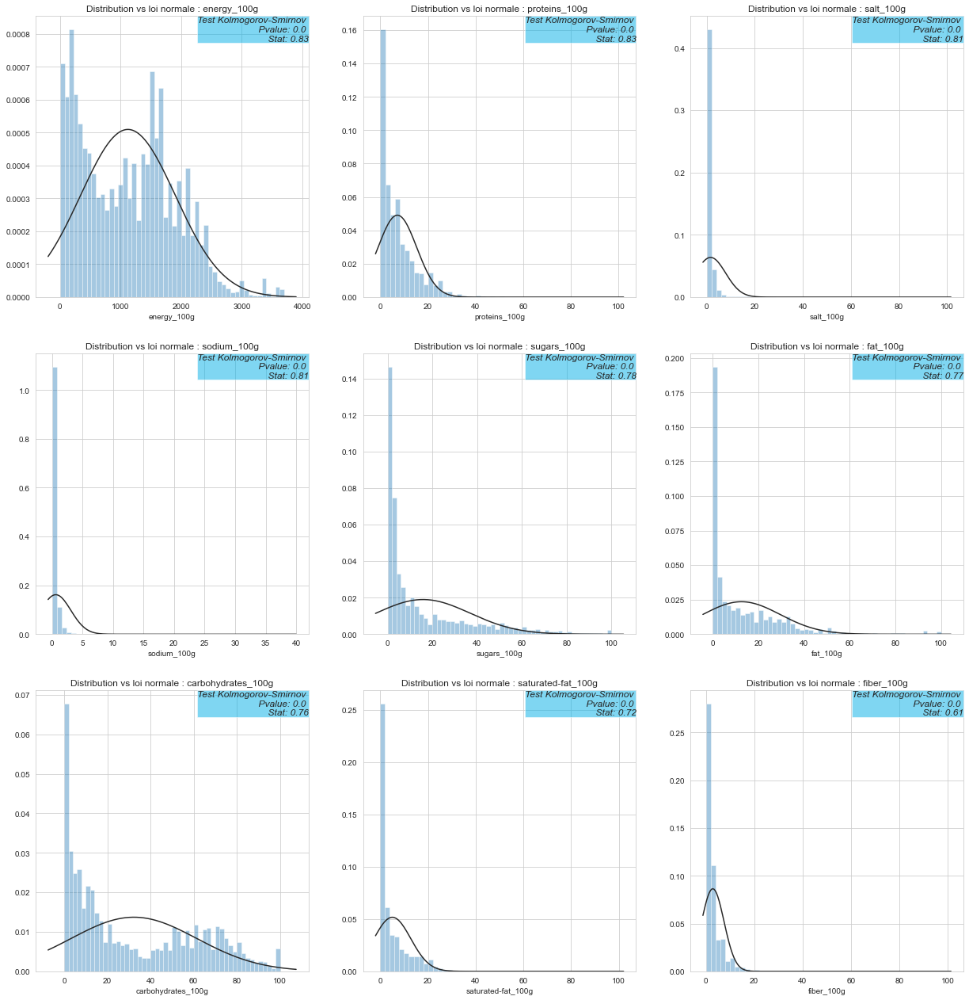

In [138]:
import scipy.stats as stats
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")
fig = plt.figure(figsize=(21,30))

sub = 0
for i in range(len(variables_100g)):
    fig.add_subplot(4,3,i+1)
    
    left, width = 0, 1
    bottom, height = 0, 1
    right = left + width
    top = bottom + height
    
    colonne = variables_100g[i]
    kstest = stats.kstest(foodSelection_cleaned[colonne].notnull(),'norm')
    ax = sns.distplot(foodSelection_cleaned[colonne], fit=stats.norm, kde=False)
    ax.set_title("Distribution vs loi normale : {}".format(colonne))
    ax.text(right, top, 'Test Kolmogorov-Smirnov \n Pvalue: {:.2} \n Stat: {:.2}'.format(kstest.pvalue, kstest.statistic),
            horizontalalignment='right',
            verticalalignment='top',
            style='italic', transform=ax.transAxes, fontsize = 12,
            bbox={'facecolor':'#00afe6', 'alpha':0.5, 'pad':0})
    sub += 1
plt.show()

on rejette donc l'hypothèse de normalité des distributions de ces variables. Il n'est donc pas souhaitable d'imputer les valeurs manquantes par la moyenne.

Pour confirmer cette approche, regardons à présent quelque unes de ces distributions en fonction de la catégorie pnns_groups_1 :

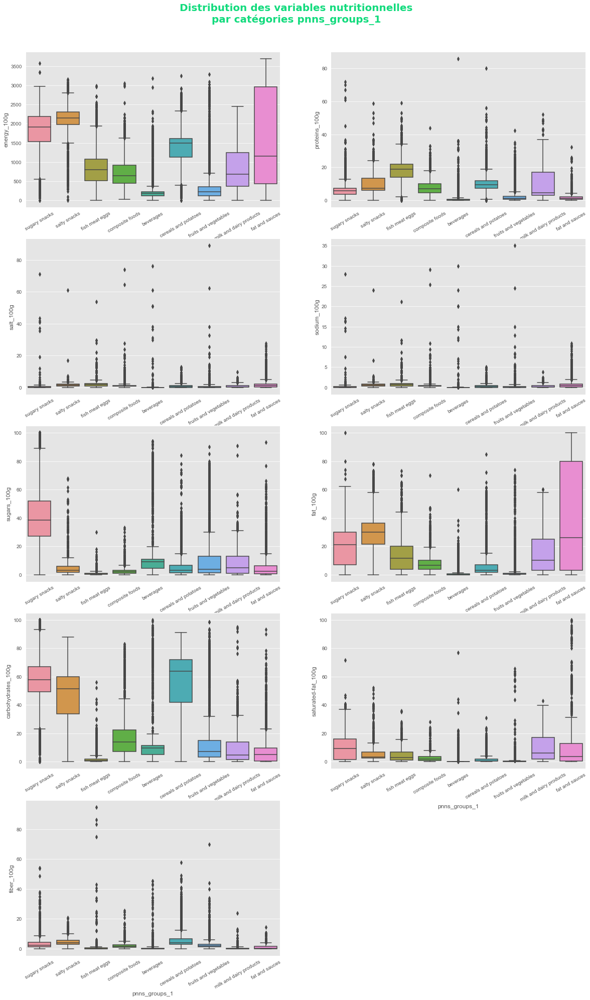

In [139]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,40))

sub = 0
for i in range(len(variables_100g)):
    fig.add_subplot(6,2,i+1)
    colonne = variables_100g[i]
    ax = sns.boxplot(x="pnns_groups_1", y=colonne, data=foodSelection_cleaned[foodSelection_cleaned["pnns_groups_1"]!="unknown"]) #on retire de la sélection les produits dont la catégorie est 'unknown'
    for tick in ax.get_xticklabels():
        tick.set_rotation(30)
    sub += 1

fig.text(0.5, 0.90, r"Distribution des variables nutritionnelles" "\n" "par catégories pnns_groups_1", ha="center", 
         fontdict=font_title)
plt.show()

Ces représentations nous permettent d'appuyer des résultats attendus, par ex., 'cereals and potatoes' et 'sugary snacks' pour la feature 'carbohydrates', 'sugary snacks' pour la feature 'sugars', proteins pour 'fish meat eggs' ou encore les produits riches en sucres et graisses pour la feature 'energy'

Si l'on regarde la distribution de quelques unes de ces mêmes variables sur la catégorie pnns_groups_2 :

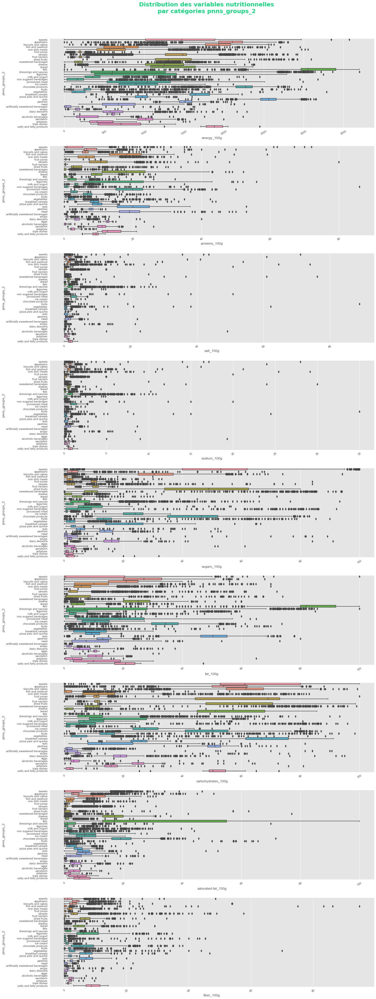

In [144]:
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,60))

sub = 0
for i in range(len(variables_100g)):
    fig.add_subplot(len(variables_100g),1,i+1)
    colonne = variables_100g[i]
    ax = sns.boxplot(y="pnns_groups_2", x=colonne, data=foodSelection_cleaned[foodSelection_cleaned["pnns_groups_2"]!="unknown"])
    for tick in ax.get_xticklabels():
        tick.set_rotation(30)
    sub += 1

fig.text(0.5, 0.90, r"Distribution des variables nutritionnelles" "\n" "par catégories pnns_groups_2", ha="center", 
         fontdict=font_title)
plt.show()

Mêmes constats mais à un niveau plus fin d'analyse, ex. pour la feature 'fat' ressortent les sauces, noix ou encore les produits chocolatés

Cette première analyse nous permet de dire qu'il serait intéressant d'investiguer des coorélations entre ces variables

## Imputation des valeurs nulles sur les features principales liées aux nutriments

In [145]:
foodSelection_cleaned[variables_100g].isnull().sum()

energy_100g            1589
proteins_100g          2634
salt_100g              6566
sodium_100g            6605
sugars_100g           15789
fat_100g              18238
carbohydrates_100g    18525
saturated-fat_100g    29592
fiber_100g            55592
dtype: int64

La feature 'fiber_100g' est mal renseignée mais nous en aurons besoin pour la suite. Nous allons donc compléter les valeurs nulles par la médiane de la catégorie pnns_groups_2.
Enfin, pour les autres variables, avec peu de null et dont les distributions ne suivent pas la loi normale, nous allons imputer avec l'algorithme KNN.

In [146]:
from sklearn.impute import KNNImputer

In [147]:
# On entraine le modèle d'imputation sur un échantillon de données
knn_features = ['energy_100g','proteins_100g','fat_100g', 'saturated-fat_100g','carbohydrates_100g', 'sugars_100g','salt_100g', 'sodium_100g']
sample_datas = foodSelection_cleaned[knn_features].sample(frac=0.25, random_state=1)
imputer = KNNImputer(n_neighbors=5, missing_values=np.nan)
imputer.fit(sample_datas)

KNNImputer()

In [148]:
# Puis on applique le modèle sur l'ensemble des données
foodSelection_imputed = imputer.transform(foodSelection_cleaned[knn_features])
df_foodSelection_imputed = pd.DataFrame(foodSelection_imputed, columns=knn_features)

In [149]:
for col_knn in knn_features:
    foodSelection_cleaned[col_knn] = df_foodSelection_imputed[col_knn].values

In [150]:
foodSelection_cleaned.isnull().sum().sort_values(ascending=False)

additives_tags             101934
fiber_100g                  55592
nutrition-score-fr_100g     36726
nutrition_grade_fr          36726
brands                       3082
countries_fr                   62
last_modified_datetime          0
fat_100g                        0
main_category_fr                0
categories_fr                   0
pnns_groups_1                   0
pnns_groups_2                   0
saturated-fat_100g              0
carbohydrates_100g              0
sugars_100g                     0
creator                         0
sodium_100g                     0
salt_100g                       0
proteins_100g                   0
energy_100g                     0
product_name                    0
states_fr                       0
url                             0
code                            0
created_datetime                0
additives_n2                    0
dtype: int64

Pour la feature 'fiber_100g', on remplace les valeurs nulles par la médiane

In [151]:
for col in ['fiber_100g']:
    foodSelection_cleaned[col] = foodSelection_cleaned.groupby('pnns_groups_2')[col].transform(lambda x: x.fillna(x.median()))

On passe les valeurs nulles ou non renseignées à 'unknown' pour la feature 'brands'

In [152]:
foodSelection_cleaned['brands'] = np.where((foodSelection_cleaned['brands'].isnull()==True), "unknown", 
                                 np.where(foodSelection_cleaned['brands'] == "", "unknown", foodSelection_cleaned['brands']))

In [153]:
foodSelection_cleaned.isnull().sum().sort_values(ascending=False)

additives_tags             101934
nutrition-score-fr_100g     36726
nutrition_grade_fr          36726
countries_fr                   62
last_modified_datetime          0
fat_100g                        0
main_category_fr                0
categories_fr                   0
pnns_groups_1                   0
pnns_groups_2                   0
fiber_100g                      0
saturated-fat_100g              0
carbohydrates_100g              0
sugars_100g                     0
creator                         0
sodium_100g                     0
salt_100g                       0
proteins_100g                   0
energy_100g                     0
brands                          0
product_name                    0
states_fr                       0
url                             0
code                            0
created_datetime                0
additives_n2                    0
dtype: int64

In [154]:
foodSelection_cleaned['additives_tags'] = foodSelection_cleaned['additives_tags'].replace(np.nan,'no additives')

In [155]:
foodSelection_cleaned.isnull().sum().sort_values(ascending=False)

nutrition-score-fr_100g    36726
nutrition_grade_fr         36726
countries_fr                  62
last_modified_datetime         0
fat_100g                       0
main_category_fr               0
categories_fr                  0
pnns_groups_1                  0
pnns_groups_2                  0
additives_tags                 0
fiber_100g                     0
saturated-fat_100g             0
carbohydrates_100g             0
sugars_100g                    0
creator                        0
sodium_100g                    0
salt_100g                      0
proteins_100g                  0
energy_100g                    0
brands                         0
product_name                   0
states_fr                      0
url                            0
code                           0
created_datetime               0
additives_n2                   0
dtype: int64

In [156]:
foodSelection_cleaned.shape

(239011, 26)

In [157]:
foodSelection_cleaned.describe()

,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,additives_n2
count,239011.000000,239011.000000,239011.000000,239011.000000,239011.000000,239011.000000,239011.000000,239011.000000,202285.000000,239011.000000,239011.000000
mean,1120.642333,7.121496,1.596630,0.627200,15.224217,12.129956,31.637054,4.577782,9.118175,2.522966,2.215739
std,781.510463,8.101338,6.196646,2.435283,20.646606,16.548964,28.433071,7.440146,9.052964,4.116341,2.189161
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000,0.000000,1.000000
25%,387.000000,0.740000,0.068580,0.027559,1.000000,0.000000,6.670000,0.000000,1.000000,0.000000,1.000000
50%,1103.000000,4.900000,0.596900,0.236220,5.040000,5.000000,21.100000,1.220000,10.000000,1.500000,1.000000
75%,1674.000000,10.000000,1.381760,0.545000,22.430000,19.548000,57.000000,6.620000,16.000000,3.100000,3.000000
max,3700.000000,100.000000,100.000000,39.370079,100.000000,100.000000,100.000000,100.000000,40.000000,100.000000,31.000000


In [158]:
np.sort(pd.unique(foodSelection_cleaned['sodium_100g']))

array([0.00000000e+00, 1.96850394e-08, 3.93700748e-08, ...,
       3.93330000e+01, 3.93425197e+01, 3.93700787e+01])

In [159]:
foodSelection_cleaned.loc[foodSelection_cleaned['additives_n2'] == 31.000000]

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr,additives_n2
184345,2016-05-01 14:05:02,agamitsudo,2016-04-17 15:03:02,2600280009649,http://world-fr.openfoodfacts.org/produit/2600...,"A vérifier,Complet,Informations nutritionnelle...",France,Confiserie,sans marque,1702.0,1.90,0.16000,0.062992,83.20,6.90,83.20,4.00,d,18.0,1.1,"e428,e14xx,e160c,e270,e296,e330,e334,e100,e120...",sweets,sugary snacks,"Snacks sucrés,Confiseries",Snacks sucrés,31
156634,2017-03-09 11:03:10,usda-ndb-import,2017-03-09 11:03:08,0846379098046,http://world-fr.openfoodfacts.org/produit/0846...,"A compléter,Informations nutritionnelles compl...",États-Unis,Italian Style Pinwheels,"Taylor Farms, Taylor Farms Illinois Inc",1033.0,10.59,1.76276,0.694000,2.35,11.76,24.71,4.71,c,10.0,3.5,"e375,e101,e500ii,e521,e450,e516,e170,e307a,e30...",unknown,unknown,unknown,unknown,31


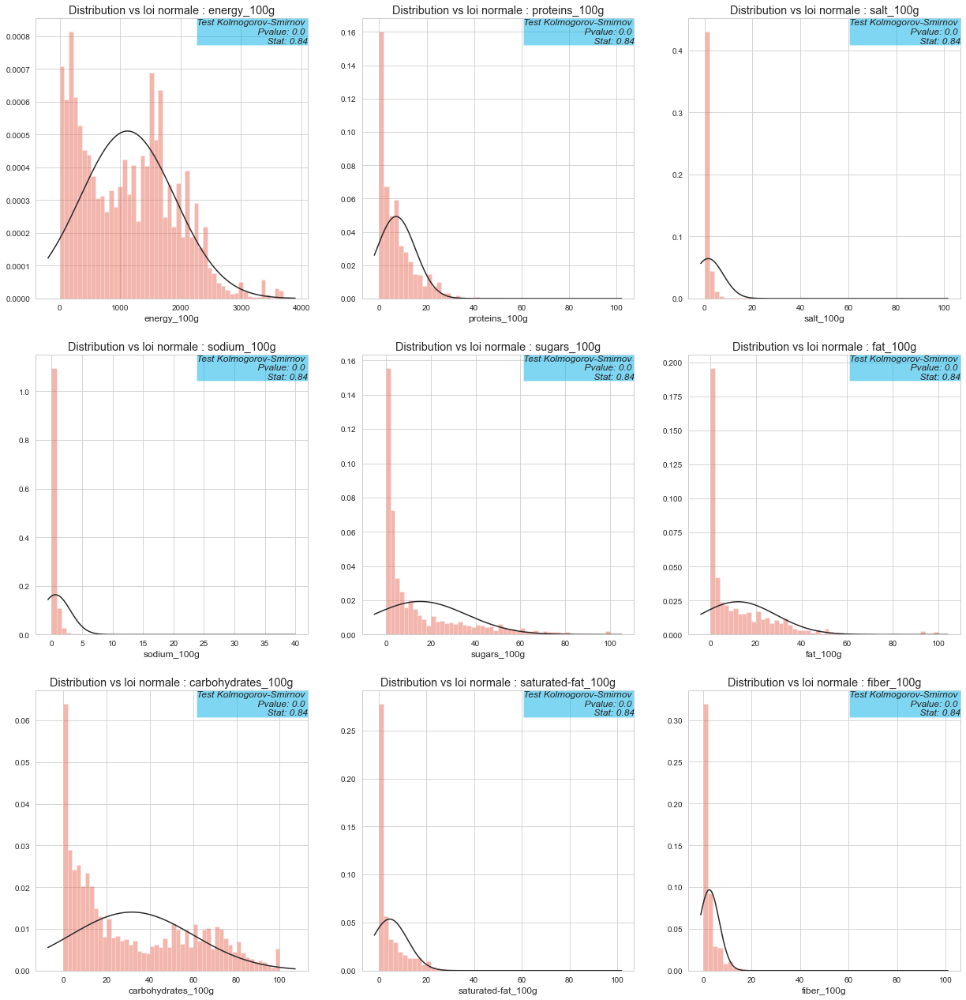

In [160]:
import scipy.stats as stats
import warnings
warnings.filterwarnings('ignore')

sns.set_style("whitegrid")
fig = plt.figure(figsize=(21,30))

sub = 0
for i in range(len(variables_100g)):
    fig.add_subplot(4,3,i+1)
    
    left, width = 0, 1
    bottom, height = 0, 1
    right = left + width
    top = bottom + height
    
    colonne = variables_100g[i]
    kstest = stats.kstest(foodSelection_cleaned[colonne].notnull(),'norm')
    ax = sns.distplot(foodSelection_cleaned[colonne], fit=stats.norm, kde=False)
    ax.set_title("Distribution vs loi normale : {}".format(colonne))
    ax.text(right, top, 'Test Kolmogorov-Smirnov \n Pvalue: {:.2} \n Stat: {:.2}'.format(kstest.pvalue, kstest.statistic),
            horizontalalignment='right',
            verticalalignment='top',
            style='italic', transform=ax.transAxes, fontsize = 12,
            bbox={'facecolor':'#00afe6', 'alpha':0.5, 'pad':0})
    sub += 1
plt.show()

En réutilisant cette formule, on se rend compte que la distribution des variables n'a pas été fondamentalement modifiée suite aux imputations que nous avons réalisées

## Calcul du nutriscore

Ce sont les dernières features à présenter des valeurs nulles, nous allons utiliser les données pour recalculer le NutriScore et le Grade et également comparer aux scores saisis, pour valider la bonne imputation des valeurs que nous avons dû estimées pour remplacer les valeurs nulles précédemment

In [161]:
nutriscore_features = ['pnns_groups_1', 'pnns_groups_2', 'nutrition_grade_fr', 'nutrition-score-fr_100g',
                       'energy_100g','sugars_100g','saturated-fat_100g','sodium_100g', 'fiber_100g', 'proteins_100g']
foodSelection_cleaned[nutriscore_features].sample(10)

,pnns_groups_1,pnns_groups_2,nutrition_grade_fr,nutrition-score-fr_100g,energy_100g,sugars_100g,saturated-fat_100g,sodium_100g,fiber_100g,proteins_100g
315083,composite foods,one dish meals,c,5.0,1009.0,2.00,2.200,0.433071,1.6,7.60
313025,unknown,unknown,NaN,NaN,962.0,60.00,0.056,0.000000,1.5,0.00
146402,unknown,unknown,d,16.0,2230.0,23.33,3.330,0.217000,1.5,16.67
80327,unknown,unknown,a,-6.0,1569.0,1.79,0.000,0.000000,8.9,10.71
215128,cereals and potatoes,cereals,a,-1.0,1515.0,0.00,0.100,0.000000,3.0,8.50
74544,unknown,unknown,e,25.0,1795.0,0.00,21.430,1.393000,0.0,28.57
273893,unknown,unknown,d,14.0,1826.0,7.00,4.700,0.827000,8.5,21.80
94847,unknown,unknown,NaN,NaN,367.4,15.22,0.000,0.336000,8.0,2.66
295603,unknown,unknown,e,21.0,1850.0,32.00,18.000,0.118110,1.5,6.00
27493,unknown,unknown,a,-1.0,1000.0,2.11,2.820,0.303000,2.8,12.68


il va nous manquer la proportion fruits/légumes pour calculer le nutri score.
Normalement, il faudrait le poids exact des composants fruits/légumes (+ le type ex. concentré/ fruits secs)... dans le produit pour déterminer ce taux selon une formule spécifique (https://www.santepubliquefrance.fr/media/files/02-determinants-de-sante/nutrition-et-activite-physique/nutri-score/qr-scientifique-technique), données dont nous ne disposons pas.

les données de la base qui nous permettraient d'avoir une information pour estimer ce pourcentage sont liés aux groupes pnns, catégories de produits. On va prendre le groupe 2 car c'est le plus détaillé.

De plus, on utilise pas le groupe 1 car il est légèrement moins renseigné que le groupe 2, donc n'apportera pas plus d'infos sur les groupes 2 'unknown'

In [162]:
pd.unique(foodSelection_cleaned['pnns_groups_2'])

array(['sweets', 'appetizers', 'biscuits and cakes', 'unknown',
       'fish and seafood', 'one dish meals', 'fruit juices', 'cereals',
       'fruit nectars', 'dried fruits', 'sweetened beverages', 'cheese',
       'bread', 'fats', 'dressings and sauces', 'legumes',
       'milk and yogurt', 'non sugared beverages', 'processed meat',
       'ice cream', 'chocolate products', 'fruits', 'vegetables',
       'breakfast cereals', 'pizza pies and quiche', 'nuts', 'pastries',
       'meat', 'artificially sweetened beverages', 'soups',
       'dairy desserts', 'eggs', 'alcoholic beverages', 'sandwich',
       'potatoes', 'tripe dishes', 'salty and fatty products'],
      dtype=object)

il va falloir splitter ces 37 catégories en 4 autres catégories : low, medium, medium-high et high

In [163]:
high_ratio_fruit = ['fruit juices', 'fruit nectars', 'dried fruits', 'legumes', 'fruits', 'vegetables', 'nuts', 'potatoes']

medium_high_ratio_fruit = ['soups']

medium_ratio_fruit = ['one dish meals', 'dressings and sauces', 'ice cream', 'pizza pies and quiche']

low_ratio_fruit = ['unknown', 'sweets', 'appetizers', 'biscuits and cakes', 'chocolate products', 'fish and seafood',
                  'cereals', 'sweetened beverages', 'cheese', 'bread', 'fats', 'milk and yogurt', 'non sugared beverages', 
                  'processed meat', 'breakfast cereals', 'artificially sweetened beverages', 'pastries',
                  'meat', 'dairy desserts', 'eggs', 'alcoholic beverages', 'sandwich', 'tripe dishes', 'salty and fatty products']


'unknown' étant la catégorie la plus fréquente, par précaution, on la classe dans 'low_ratio_fruit', où l'on retrouve également le plus de catégories

In [164]:
foodSelection_cleaned['fruits-legumes-ratio_100g'] = [90 if groupe in high_ratio_fruit else 70 if groupe in medium_high_ratio_fruit else 50 if groupe in medium_ratio_fruit else 20 for groupe in foodSelection_cleaned.pnns_groups_2]

In [165]:
foodSelection_cleaned.sample(5)

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr,additives_n2,fruits-legumes-ratio_100g
22768,2017-03-09 11:48:26,usda-ndb-import,2017-03-09 11:48:26,0026662523206,http://world-fr.openfoodfacts.org/produit/0026...,"A compléter,Informations nutritionnelles compl...",États-Unis,"Enriched Macaroni Product, Stelline",Cora,1569.0,10.71,0.00000,0.000000,3.57,1.79,76.79,0.00,a,-6.0,3.6,"e375,e101",unknown,unknown,unknown,unknown,2,20
1881,2017-03-10 11:05:27,usda-ndb-import,2017-03-10 11:05:27,0011110018342,http://world-fr.openfoodfacts.org/produit/0011...,"A compléter,Informations nutritionnelles compl...",États-Unis,"100% Juice, Grape","Kroger, The Kroger Co.",259.0,0.00,0.03810,0.015000,15.00,0.00,15.42,0.00,c,3.0,0.0,"e330,e300",unknown,unknown,unknown,unknown,2,20
308870,2015-10-03 15:14:11,javichu,2013-11-11 15:09:21,8422791005170,http://world-fr.openfoodfacts.org/produit/8422...,"A vérifier,Complet,Informations nutritionnelle...",Espagne,Tableta de chocolate negro con jengibre y nara...,"Vegetalia,//Propiedad de://,Salvador Sala Drug...",2400.0,7.00,0.58040,0.228504,46.88,38.00,50.00,23.20,NaN,NaN,5.0,no additives,chocolate products,sugary snacks,"Snacks sucrés,Chocolats,Chocolats noirs",Chocolats,1,20
86397,2017-03-09 17:02:25,usda-ndb-import,2017-03-09 17:02:25,0074331904641,http://world-fr.openfoodfacts.org/produit/0074...,"A compléter,Informations nutritionnelles compl...",États-Unis,Seafood Dip,Shaw's Southern Belle Frozen Foods Llc,732.0,5.26,1.11506,0.439000,1.75,12.28,10.53,6.14,d,12.0,0.0,e170,unknown,unknown,unknown,unknown,1,20
83570,2017-03-09 10:41:04,usda-ndb-import,2017-03-09 10:41:04,0073296166064,http://world-fr.openfoodfacts.org/produit/0073...,"A compléter,Informations nutritionnelles compl...",États-Unis,Large Ripe Olives,Key Food,699.0,0.00,1.94818,0.767000,0.00,16.67,6.67,0.00,NaN,NaN,1.5,e579,unknown,unknown,unknown,unknown,1,20


En utilisant les formules, on peut maintenant calculer un nutriscore par produit

In [166]:
boissons = ['fruit juices', 'fruit nectars', 'sweetened beverages', 'non sugared beverages', 
            'artificially sweetened beverages', 'alcoholic beverages']

lipides = ['fats']

autres = ['unknown', 'sweets', 'appetizers', 'biscuits and cakes', 'chocolate products', 'fish and seafood',
            'cereals', 'cheese', 'bread', 'milk and yogurt', 'one dish meals', 'dressings and sauces',
            'ice cream', 'pizza pies and quiche', 'processed meat', 'breakfast cereals', 'pastries',
            'meat', 'dairy desserts', 'eggs', 'sandwich', 'tripe dishes', 'salty and fatty products',
            'dried fruits', 'legumes', 'fruits', 'vegetables', 'potatoes', 'soups', 'nuts']

on calcule le ratio graisses saturées/graisses pour la catégorie spécifique des matières grasses (cf. lipides dans la case précédente)

In [167]:
foodSelection_cleaned['sat-fat_ratio'] = foodSelection_cleaned["saturated-fat_100g"]/foodSelection_cleaned["fat_100g"]

In [168]:
foodSelection_cleaned.sample(5)

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr,additives_n2,fruits-legumes-ratio_100g,sat-fat_ratio
219594,2017-02-11 11:18:04,kiliweb,2017-02-11 11:18:04,3270160850150,http://world-fr.openfoodfacts.org/produit/3270...,"A compléter,Informations nutritionnelles compl...",France,Assortiment de sticks feuilletés graines-froma...,Léa Nature,2351.0,11.10,2.03000,0.799213,2.2,3.386,37.620,23.7,e,20.0,3.6,no additives,unknown,unknown,unknown,unknown,1,20,6.999409
199745,2015-11-14 14:14:11,openfoodfacts-contributors,2014-06-03 11:02:27,3222471012611,http://world-fr.openfoodfacts.org/produit/3222...,"A vérifier,Complet,Informations nutritionnelle...",France,Véritables Rillettes du Mans,Casino,1681.0,14.00,1.20000,0.472441,0.0,39.000,0.000,15.0,e,20.0,0.5,e250,processed meat,fish meat eggs,"Frais,Viandes,Produits à tartiner,Charcuteries...",Produits à tartiner salés,1,20,0.384615
85146,2017-03-09 21:19:59,usda-ndb-import,2017-03-09 21:19:59,0073731091043,http://world-fr.openfoodfacts.org/produit/0073...,"A compléter,Informations nutritionnelles compl...",États-Unis,Tostadas Horneadas,Mission,1695.0,8.11,1.99136,0.784000,2.7,4.050,81.080,0.0,c,8.0,8.1,"e375,e101,e412,e415,e466",unknown,unknown,unknown,unknown,5,20,0.000000
107224,2017-03-09 14:16:31,usda-ndb-import,2017-03-09 14:16:30,0092227332149,http://world-fr.openfoodfacts.org/produit/0092...,"A compléter,Informations nutritionnelles compl...",États-Unis,Knockwurst Garlic Sausage,Slotkowski,1297.0,12.00,2.48920,0.980000,2.0,27.000,3.000,11.0,e,23.0,0.0,"e325,e316,e250",unknown,unknown,unknown,unknown,3,20,0.407407
198480,2017-04-01 12:54:34,openfoodfacts-contributors,2016-09-17 17:42:08,3181232138369,http://world-fr.openfoodfacts.org/produit/3181...,"A compléter,Informations nutritionnelles compl...",France,Cheese burger,Charal,1205.0,14.00,0.98000,0.385827,8.2,11.260,46.032,4.9,d,12.0,0.0,no additives,sandwich,composite foods,"Sandwichs,Cheeseburger",Sandwichs,1,20,0.435169


In [169]:
pd.unique(foodSelection_cleaned['sat-fat_ratio'])

array([0.64220183, 0.08387097, 0.28125   , ..., 0.12671233, 0.6121673 ,
       0.66627566])

In [170]:
foodSelection_cleaned['sat-fat_ratio'] = foodSelection_cleaned['sat-fat_ratio'].fillna(0)

In [176]:
foodSelection_cleaned = foodSelection_cleaned[~((foodSelection_cleaned['saturated-fat_100g'] > foodSelection_cleaned['fat_100g']) 
                                | (foodSelection_cleaned['sodium_100g'] > foodSelection_cleaned['salt_100g'])
                                | (foodSelection_cleaned['sugars_100g'] > foodSelection_cleaned['carbohydrates_100g']))]

Suite aux différentes imputations, il faut reprocéder au contrôle de cohérence sur les features liées( fat / sat_fat etc...)

In [178]:
foodSelection_cleaned.sort_values(by=['sat-fat_ratio'], ascending=False).iloc[:5]

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr,additives_n2,fruits-legumes-ratio_100g,sat-fat_ratio
178633,2017-03-11 08:04:37,openfoodfacts-contributors,2016-02-06 13:49:43,20203610,http://world-fr.openfoodfacts.org/produit/2020...,"A compléter,Informations nutritionnelles compl...",France,Aiguillettes de poulet,Piquebroche,435.0,23.00,0.100,0.039370,0.0,0.50,9.24,0.50,a,-4.0,0.0,no additives,unknown,unknown,unknown,unknown,1,20,1.0
180112,2015-12-30 18:26:20,hangy,2015-12-30 18:16:10,20486396,http://world-fr.openfoodfacts.org/produit/2048...,"A vérifier,Complet,Informations nutritionnelle...",Allemagne,Die Feine Johannisbeeren,Maribel,839.0,0.30,0.050,0.019685,47.0,0.10,47.00,0.10,d,11.0,1.1,"e440,e330",sweets,sugary snacks,"Aliments et boissons à base de végétaux,Alimen...",Confitures,2,20,1.0
271972,2016-01-20 18:04:31,frogman,2016-01-19 14:05:37,5020934001008,http://world-fr.openfoodfacts.org/produit/5020...,"A vérifier,Complet,Informations nutritionnelle...",Royaume-Uni,Beet It organic beetroot juice,"James White,Beet It",172.0,0.92,0.040,0.015700,9.0,0.04,9.20,0.04,b,1.0,1.5,no additives,unknown,unknown,en:Beetroot-juice,en:Beetroot-juice,1,20,1.0
26526,2017-03-09 16:53:48,usda-ndb-import,2017-03-09 16:53:48,0030684711305,http://world-fr.openfoodfacts.org/produit/0030...,"A compléter,Informations nutritionnelles compl...",États-Unis,"Spring Haven Farms, Grated Parmesan Cheese",Tree Of Life Inc.,1674.0,40.00,2.794,1.100000,0.0,20.00,0.00,20.00,e,24.0,0.0,e460ii,unknown,unknown,unknown,unknown,1,20,1.0
26527,2017-03-09 16:53:48,usda-ndb-import,2017-03-09 16:53:48,0030684711312,http://world-fr.openfoodfacts.org/produit/0030...,"A compléter,Informations nutritionnelles compl...",États-Unis,"Spring Haven Farms, Shredded Parmesan Cheese",Tree Of Life Inc.,1674.0,40.00,2.794,1.100000,0.0,20.00,0.00,20.00,e,24.0,0.0,e460ii,unknown,unknown,unknown,unknown,1,20,1.0


### Formule de calcul du NutriScore

selon le type de produits (boissons, matières grasses, autres) et les différents seuils associés

In [180]:
def calc_nutriscore(row):
    if row["pnns_groups_2"] in boissons:
        #Energy
        if row["energy_100g"] <= 0:
            a = 0
        elif ((row["energy_100g"] > 0) & (row["energy_100g"] <= 30)):
            a = 1
        elif ((row["energy_100g"] > 30) & (row["energy_100g"] <= 60)):
            a = 2
        elif ((row["energy_100g"] > 60) & (row["energy_100g"] <= 90)):
            a = 3
        elif ((row["energy_100g"] > 90) & (row["energy_100g"] <= 120)):
            a = 4
        elif ((row["energy_100g"] > 120) & (row["energy_100g"] <= 150)):
            a = 5
        elif ((row["energy_100g"] > 150) & (row["energy_100g"] <= 180)):
            a = 6
        elif ((row["energy_100g"] > 180) & (row["energy_100g"] <= 210)):
            a = 7
        elif ((row["energy_100g"] > 210) & (row["energy_100g"] <= 240)):
            a = 8
        elif ((row["energy_100g"] > 240) & (row["energy_100g"] <= 270)):
            a = 9
        else:
            a = 10 
        #Sugar
        if row["sugars_100g"] <= 0:
            b = 0
        elif ((row["sugars_100g"] > 0) & (row["sugars_100g"] <= 1.5)):
            b = 1
        elif ((row["sugars_100g"] > 1.5) & (row["sugars_100g"] <= 3)):
            b = 2
        elif ((row["sugars_100g"] > 3) & (row["sugars_100g"] <= 4.5)):
            b = 3
        elif ((row["sugars_100g"] > 4.5) & (row["sugars_100g"] <= 6)):
            b = 4
        elif ((row["sugars_100g"] > 6) & (row["sugars_100g"] <= 7.5)):
            b = 5
        elif ((row["sugars_100g"] > 7.5) & (row["sugars_100g"] <= 9)):
            b = 6
        elif ((row["sugars_100g"] > 9) & (row["sugars_100g"] <= 10.5)):
            b = 7
        elif ((row["sugars_100g"] > 10.5) & (row["sugars_100g"] <= 12)):
            b = 8
        elif ((row["sugars_100g"] > 12) & (row["sugars_100g"] <= 13.5)):
            b = 9
        else:
            b = 10
        #saturated-fat
        if row["saturated-fat_100g"] <= 1:
            c = 0
        elif ((row["saturated-fat_100g"] > 1) & (row["saturated-fat_100g"] <= 2)):
            c = 1
        elif ((row["saturated-fat_100g"] > 2) & (row["saturated-fat_100g"] <= 3)):
            c = 2
        elif ((row["saturated-fat_100g"] > 3) & (row["saturated-fat_100g"] <= 4)):
            c = 3
        elif ((row["saturated-fat_100g"] > 4) & (row["saturated-fat_100g"] <= 5)):
            c = 4
        elif ((row["saturated-fat_100g"] > 5) & (row["saturated-fat_100g"] <= 6)):
            c = 5
        elif ((row["saturated-fat_100g"] > 6) & (row["saturated-fat_100g"] <= 7)):
            c = 6
        elif ((row["saturated-fat_100g"] > 7) & (row["saturated-fat_100g"] <= 8)):
            c = 7
        elif ((row["saturated-fat_100g"] > 8) & (row["saturated-fat_100g"] <= 9)):
            c = 8
        elif ((row["saturated-fat_100g"] > 9) & (row["saturated-fat_100g"] <= 10)):
            c = 9
        else:
            c = 10
        #sodium
        if (row["sodium_100g"]*1000) <= 90:
            d = 0
        elif (((row["sodium_100g"]*1000) > 90) & ((row["sodium_100g"]*1000) <= 180)):
            d = 1
        elif (((row["sodium_100g"]*1000) > 180) & ((row["sodium_100g"]*1000) <= 270)):
            d = 2
        elif (((row["sodium_100g"]*1000) > 270) & ((row["sodium_100g"]*1000) <= 360)):
            d = 3
        elif (((row["sodium_100g"]*1000) > 360) & ((row["sodium_100g"]*1000) <= 450)):
            d = 4
        elif (((row["sodium_100g"]*1000) > 450) & ((row["sodium_100g"]*1000) <= 540)):
            d = 5
        elif (((row["sodium_100g"]*1000) > 540) & ((row["sodium_100g"]*1000) <= 630)):
            d = 6
        elif (((row["sodium_100g"]*1000) > 630) & ((row["sodium_100g"]*1000) <= 720)):
            d = 7
        elif (((row["sodium_100g"]*1000) > 720) & ((row["sodium_100g"]*1000) <= 810)):
            d = 8
        elif (((row["sodium_100g"]*1000) > 810) & ((row["sodium_100g"]*1000) <= 900)):
            d = 9
        else:
            d = 10
        #fruits-legumes-ratio
        if row["fruits-legumes-ratio_100g"] <= 40:
            e = 0
        elif ((row["fruits-legumes-ratio_100g"] > 40) & (row["fruits-legumes-ratio_100g"] <= 60)):
            e = 1
        elif ((row["fruits-legumes-ratio_100g"] > 60) & (row["fruits-legumes-ratio_100g"] <= 80)):
            e = 2
        else:
            e = 5
        #fiber
        if row["fiber_100g"] <= 0.9:
            f = 0
        elif ((row["fiber_100g"] > 0.9) & (row["fiber_100g"] <= 1.9)):
            f = 1
        elif ((row["fiber_100g"] > 1.9) & (row["fiber_100g"] <= 2.8)):
            f = 2
        elif ((row["fiber_100g"] > 2.8) & (row["fiber_100g"] <= 3.7)):
            f = 3
        elif ((row["fiber_100g"] > 3.7) & (row["fiber_100g"] <= 4.7)):
            f = 4
        else:
            f = 5
        #proteins
        if row["proteins_100g"] <= 1.6:
            g = 0
        elif ((row["proteins_100g"] > 1.6) & (row["proteins_100g"] <= 3.2)):
            g = 1
        elif ((row["proteins_100g"] > 3.2) & (row["proteins_100g"] <= 4.8)):
            g = 2
        elif ((row["proteins_100g"] > 4.8) & (row["proteins_100g"] <= 6.4)):
            g = 3
        elif ((row["proteins_100g"] > 6.4) & (row["proteins_100g"] <= 8)):
            g = 4
        else:
            g = 5
    elif row["pnns_groups_2"] in lipides :
        #Energy
        if row["energy_100g"] <= 335:
            a = 0
        elif ((row["energy_100g"] > 335) & (row["energy_100g"] <= 670)):
            a = 1
        elif ((row["energy_100g"] > 670) & (row["energy_100g"] <= 1005)):
            a = 2
        elif ((row["energy_100g"] > 1005) & (row["energy_100g"] <= 1340)):
            a = 3
        elif ((row["energy_100g"] > 1340) & (row["energy_100g"] <= 1675)):
            a = 4
        elif ((row["energy_100g"] > 1675) & (row["energy_100g"] <= 2010)):
            a = 5
        elif ((row["energy_100g"] > 2010) & (row["energy_100g"] <= 2345)):
            a = 6
        elif ((row["energy_100g"] > 2345) & (row["energy_100g"] <= 2680)):
            a = 7
        elif ((row["energy_100g"] > 2680) & (row["energy_100g"] <= 3015)):
            a = 8
        elif ((row["energy_100g"] > 3015) & (row["energy_100g"] <= 3350)):
            a = 9
        else:
            a = 10 
        #Sugar
        if row["sugars_100g"] <= 4.5:
            b = 0
        elif ((row["sugars_100g"] > 4.5) & (row["sugars_100g"] <= 9)):
            b = 1
        elif ((row["sugars_100g"] > 9) & (row["sugars_100g"] <= 13.5)):
            b = 2
        elif ((row["sugars_100g"] > 13.5) & (row["sugars_100g"] <= 18)):
            b = 3
        elif ((row["sugars_100g"] > 18) & (row["sugars_100g"] <= 22.5)):
            b = 4
        elif ((row["sugars_100g"] > 22.5) & (row["sugars_100g"] <= 27)):
            b = 5
        elif ((row["sugars_100g"] > 27) & (row["sugars_100g"] <= 31)):
            b = 6
        elif ((row["sugars_100g"] > 31) & (row["sugars_100g"] <= 36)):
            b = 7
        elif ((row["sugars_100g"] > 36) & (row["sugars_100g"] <= 40)):
            b = 8
        elif ((row["sugars_100g"] > 40) & (row["sugars_100g"] <= 45)):
            b = 9
        else:
            b = 10
        #saturated-fat
        if row["sat-fat_ratio"] < 0.10:
            c = 0
        elif ((row["sat-fat_ratio"] >= 0.10) & (row["sat-fat_ratio"] <= 0.16)):
            c = 1
        elif ((row["sat-fat_ratio"] >= 0.16) & (row["sat-fat_ratio"] <= 0.22)):
            c = 2
        elif ((row["sat-fat_ratio"] >= 0.22) & (row["sat-fat_ratio"] <= 0.28)):
            c = 3
        elif ((row["sat-fat_ratio"] >= 0.28) & (row["sat-fat_ratio"] <= 0.34)):
            c = 4
        elif ((row["sat-fat_ratio"] >= 0.34) & (row["sat-fat_ratio"] <= 0.40)):
            c = 5
        elif ((row["sat-fat_ratio"] >= 0.40) & (row["sat-fat_ratio"] <= 0.46)):
            c = 6
        elif ((row["sat-fat_ratio"] >= 0.46) & (row["sat-fat_ratio"] <= 0.52)):
            c = 7
        elif ((row["sat-fat_ratio"] >= 0.52) & (row["sat-fat_ratio"] <= 0.58)):
            c = 8
        elif ((row["sat-fat_ratio"] >= 0.58) & (row["sat-fat_ratio"] <= 0.64)):
            c = 9
        else:
            c = 10
        #sodium
        if (row["sodium_100g"]*1000) <= 90:
            d = 0
        elif (((row["sodium_100g"]*1000) > 90) & ((row["sodium_100g"]*1000) <= 180)):
            d = 1
        elif (((row["sodium_100g"]*1000) > 180) & ((row["sodium_100g"]*1000) <= 270)):
            d = 2
        elif (((row["sodium_100g"]*1000) > 270) & ((row["sodium_100g"]*1000) <= 360)):
            d = 3
        elif (((row["sodium_100g"]*1000) > 360) & ((row["sodium_100g"]*1000) <= 450)):
            d = 4
        elif (((row["sodium_100g"]*1000) > 450) & ((row["sodium_100g"]*1000) <= 540)):
            d = 5
        elif (((row["sodium_100g"]*1000) > 540) & ((row["sodium_100g"]*1000) <= 630)):
            d = 6
        elif (((row["sodium_100g"]*1000) > 630) & ((row["sodium_100g"]*1000) <= 720)):
            d = 7
        elif (((row["sodium_100g"]*1000) > 720) & ((row["sodium_100g"]*1000) <= 810)):
            d = 8
        elif (((row["sodium_100g"]*1000) > 810) & ((row["sodium_100g"]*1000) <= 900)):
            d = 9
        else:
            d = 10
        #fruits-legumes-ratio
        if row["fruits-legumes-ratio_100g"] <= 40:
            e = 0
        elif ((row["fruits-legumes-ratio_100g"] > 40) & (row["fruits-legumes-ratio_100g"] <= 60)):
            e = 1
        elif ((row["fruits-legumes-ratio_100g"] > 60) & (row["fruits-legumes-ratio_100g"] <= 80)):
            e = 2
        else:
            e = 5
        #fiber
        if row["fiber_100g"] <= 0.9:
            f = 0
        elif ((row["fiber_100g"] > 0.9) & (row["fiber_100g"] <= 1.9)):
            f = 1
        elif ((row["fiber_100g"] > 1.9) & (row["fiber_100g"] <= 2.8)):
            f = 2
        elif ((row["fiber_100g"] > 2.8) & (row["fiber_100g"] <= 3.7)):
            f = 3
        elif ((row["fiber_100g"] > 3.7) & (row["fiber_100g"] <= 4.7)):
            f = 4
        else:
            f = 5
        #proteins
        if row["proteins_100g"] <= 1.6:
            g = 0
        elif ((row["proteins_100g"] > 1.6) & (row["proteins_100g"] <= 3.2)):
            g = 1
        elif ((row["proteins_100g"] > 3.2) & (row["proteins_100g"] <= 4.8)):
            g = 2
        elif ((row["proteins_100g"] > 4.8) & (row["proteins_100g"] <= 6.4)):
            g = 3
        elif ((row["proteins_100g"] > 6.4) & (row["proteins_100g"] <= 8)):
            g = 4
        else:
            g = 5
    else:
        #Energy
        if row["energy_100g"] <= 335:
            a = 0
        elif ((row["energy_100g"] > 335) & (row["energy_100g"] <= 670)):
            a = 1
        elif ((row["energy_100g"] > 670) & (row["energy_100g"] <= 1005)):
            a = 2
        elif ((row["energy_100g"] > 1005) & (row["energy_100g"] <= 1340)):
            a = 3
        elif ((row["energy_100g"] > 1340) & (row["energy_100g"] <= 1675)):
            a = 4
        elif ((row["energy_100g"] > 1675) & (row["energy_100g"] <= 2010)):
            a = 5
        elif ((row["energy_100g"] > 2010) & (row["energy_100g"] <= 2345)):
            a = 6
        elif ((row["energy_100g"] > 2345) & (row["energy_100g"] <= 2680)):
            a = 7
        elif ((row["energy_100g"] > 2680) & (row["energy_100g"] <= 3015)):
            a = 8
        elif ((row["energy_100g"] > 3015) & (row["energy_100g"] <= 3350)):
            a = 9
        else:
            a = 10 
        #Sugar
        if row["sugars_100g"] <= 4.5:
            b = 0
        elif ((row["sugars_100g"] > 4.5) & (row["sugars_100g"] <= 9)):
            b = 1
        elif ((row["sugars_100g"] > 9) & (row["sugars_100g"] <= 13.5)):
            b = 2
        elif ((row["sugars_100g"] > 13.5) & (row["sugars_100g"] <= 18)):
            b = 3
        elif ((row["sugars_100g"] > 18) & (row["sugars_100g"] <= 22.5)):
            b = 4
        elif ((row["sugars_100g"] > 22.5) & (row["sugars_100g"] <= 27)):
            b = 5
        elif ((row["sugars_100g"] > 27) & (row["sugars_100g"] <= 31)):
            b = 6
        elif ((row["sugars_100g"] > 31) & (row["sugars_100g"] <= 36)):
            b = 7
        elif ((row["sugars_100g"] > 36) & (row["sugars_100g"] <= 40)):
            b = 8
        elif ((row["sugars_100g"] > 40) & (row["sugars_100g"] <= 45)):
            b = 9
        else:
            b = 10
        #saturated-fat
        if row["saturated-fat_100g"] <= 1:
            c = 0
        elif ((row["saturated-fat_100g"] > 1) & (row["saturated-fat_100g"] <= 2)):
            c = 1
        elif ((row["saturated-fat_100g"] > 2) & (row["saturated-fat_100g"] <= 3)):
            c = 2
        elif ((row["saturated-fat_100g"] > 3) & (row["saturated-fat_100g"] <= 4)):
            c = 3
        elif ((row["saturated-fat_100g"] > 4) & (row["saturated-fat_100g"] <= 5)):
            c = 4
        elif ((row["saturated-fat_100g"] > 5) & (row["saturated-fat_100g"] <= 6)):
            c = 5
        elif ((row["saturated-fat_100g"] > 6) & (row["saturated-fat_100g"] <= 7)):
            c = 6
        elif ((row["saturated-fat_100g"] > 7) & (row["saturated-fat_100g"] <= 8)):
            c = 7
        elif ((row["saturated-fat_100g"] > 8) & (row["saturated-fat_100g"] <= 9)):
            c = 8
        elif ((row["saturated-fat_100g"] > 9) & (row["saturated-fat_100g"] <= 10)):
            c = 9
        else:
            c = 10
        #sodium
        if (row["sodium_100g"]*1000) <= 90:
            d = 0
        elif (((row["sodium_100g"]*1000) > 90) & ((row["sodium_100g"]*1000) <= 180)):
            d = 1
        elif (((row["sodium_100g"]*1000) > 180) & ((row["sodium_100g"]*1000) <= 270)):
            d = 2
        elif (((row["sodium_100g"]*1000) > 270) & ((row["sodium_100g"]*1000) <= 360)):
            d = 3
        elif (((row["sodium_100g"]*1000) > 360) & ((row["sodium_100g"]*1000) <= 450)):
            d = 4
        elif (((row["sodium_100g"]*1000) > 450) & ((row["sodium_100g"]*1000) <= 540)):
            d = 5
        elif (((row["sodium_100g"]*1000) > 540) & ((row["sodium_100g"]*1000) <= 630)):
            d = 6
        elif (((row["sodium_100g"]*1000) > 630) & ((row["sodium_100g"]*1000) <= 720)):
            d = 7
        elif (((row["sodium_100g"]*1000) > 720) & ((row["sodium_100g"]*1000) <= 810)):
            d = 8
        elif (((row["sodium_100g"]*1000) > 810) & ((row["sodium_100g"]*1000) <= 900)):
            d = 9
        else:
            d = 10
        #fruits-legumes-ratio
        if row["fruits-legumes-ratio_100g"] <= 40:
            e = 0
        elif ((row["fruits-legumes-ratio_100g"] > 40) & (row["fruits-legumes-ratio_100g"] <= 60)):
            e = 1
        elif ((row["fruits-legumes-ratio_100g"] > 60) & (row["fruits-legumes-ratio_100g"] <= 80)):
            e = 2
        else:
            e = 5
        #fiber
        if row["fiber_100g"] <= 0.9:
            f = 0
        elif ((row["fiber_100g"] > 0.9) & (row["fiber_100g"] <= 1.9)):
            f = 1
        elif ((row["fiber_100g"] > 1.9) & (row["fiber_100g"] <= 2.8)):
            f = 2
        elif ((row["fiber_100g"] > 2.8) & (row["fiber_100g"] <= 3.7)):
            f = 3
        elif ((row["fiber_100g"] > 3.7) & (row["fiber_100g"] <= 4.7)):
            f = 4
        else:
            f = 5
        #proteins
        if row["proteins_100g"] <= 1.6:
            g = 0
        elif ((row["proteins_100g"] > 1.6) & (row["proteins_100g"] <= 3.2)):
            g = 1
        elif ((row["proteins_100g"] > 3.2) & (row["proteins_100g"] <= 4.8)):
            g = 2
        elif ((row["proteins_100g"] > 4.8) & (row["proteins_100g"] <= 6.4)):
            g = 3
        elif ((row["proteins_100g"] > 6.4) & (row["proteins_100g"] <= 8)):
            g = 4
        else:
            g = 5
    
    #Score
    N_score = a+b+c+d
    P_score = e+f+g
    if N_score >= 11 & e < 5:
        nutriscore = N_score - e - f
    else:
        nutriscore = N_score - P_score
    
    
    return nutriscore

In [181]:
#Nutriscore_grade
def calc_nutriscore_grade(row):
    if row["calc_nutriscore"] <= -1 :
        nutriscore_grade = "a"
    elif ((row["calc_nutriscore"] >= 0) & (row["calc_nutriscore"] <= 2)) :
        nutriscore_grade = "b"
    elif ((row["calc_nutriscore"] >= 3) & (row["calc_nutriscore"] <= 10)) :
        nutriscore_grade = "c"
    elif ((row["calc_nutriscore"] >= 11) & (row["calc_nutriscore"] <= 18)) :
        nutriscore_grade = "d"
    else:
        nutriscore_grade = "e"
        
    return nutriscore_grade

In [182]:
foodSelection_cleaned['calc_nutriscore'] = foodSelection_cleaned.apply(lambda row: calc_nutriscore(row),axis=1)
foodSelection_cleaned['calc_nutriscore_grade'] = foodSelection_cleaned.apply(lambda row: calc_nutriscore_grade(row),axis=1)

In [183]:
foodSelection_cleaned.head()

,last_modified_datetime,creator,created_datetime,code,url,states_fr,countries_fr,product_name,brands,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition_grade_fr,nutrition-score-fr_100g,fiber_100g,additives_tags,pnns_groups_2,pnns_groups_1,categories_fr,main_category_fr,additives_n2,fruits-legumes-ratio_100g,sat-fat_ratio,calc_nutriscore,calc_nutriscore_grade
251761,2016-12-23 16:38:19,stephane,2012-01-31 14:43:58,3760029248001,http://world-fr.openfoodfacts.org/produit/3760...,"A vérifier,Complet,Informations nutritionnelle...",France,Caramels tendres au beurre salé au sel de Guér...,Carabreizh,1717.0,3.0,1.7000,0.669291,49.3,10.9,73.5,7.0,e,28.0,1.1,"e500,e322",sweets,sugary snacks,"Epicerie,Snacks sucrés,Confiseries,Caramels",Epicerie,2,20,0.642202,27,e
188901,2016-12-23 16:38:19,stephane,2012-02-09 10:34:56,3029330062806,http://world-fr.openfoodfacts.org/produit/3029...,"A compléter,Informations nutritionnelles compl...",France,Jacquet Les bouchées créatives à garnir,Jacquet,1898.0,8.5,1.7526,0.690000,2.0,15.5,68.0,1.3,c,9.0,3.0,e920,appetizers,salty snacks,"Snacks salés,Apéritif,Biscuits apéritifs",Snacks salés,1,20,0.083871,10,c
212131,2016-03-26 18:23:42,marianne,2012-02-11 14:51:07,3257980112590,http://world-fr.openfoodfacts.org/produit/3257...,"A vérifier,Complet,Informations nutritionnelle...",France,Boudoirs,Cora,1637.0,7.6,0.3810,0.150000,55.3,3.2,81.0,0.9,d,13.0,1.5,"e450i,e500,e503",biscuits and cakes,sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Biscuits,3,20,0.281250,14,d
195704,2014-06-27 16:50:06,stephane,2012-02-11 18:51:58,3160181210524,http://world-fr.openfoodfacts.org/produit/3160...,"A vérifier,Complet,Informations nutritionnelle...",France,Cookies tout chocolat Biocoop,Biocoop,2040.0,7.0,0.3810,0.150000,33.0,25.0,56.0,14.0,e,19.0,5.5,"e322,e503",biscuits and cakes,sugary snacks,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",Cookies,2,20,0.560000,19,e
291384,2014-12-31 03:07:48,andre,2012-02-12 08:51:55,7613031264285,http://world-fr.openfoodfacts.org/produit/7613...,"A vérifier,Complet,Informations nutritionnelle...",Pologne,SMACZNA ZUPA Grochova,"WINIARY,Nestlé",159.0,1.8,1.0160,0.400000,0.4,0.8,5.5,0.3,c,3.0,0.7,"e1400,e621,e635",unknown,unknown,pl:Soupes-deshydratees,pl:Soupes-deshydratees,3,20,0.375000,4,c


Sur la base des 5 premières lignes, les résultats sont assez proches donc prometteurs mais nous allons faire un test d'accuracy_score pour nous en assurer :

In [184]:
df_scores = foodSelection_cleaned[['nutrition_grade_fr', 'nutrition-score-fr_100g', 'calc_nutriscore', 'calc_nutriscore_grade']][foodSelection_cleaned['nutrition_grade_fr'].isnull()==False]

from sklearn.metrics import accuracy_score

accuracy_nutriscore = accuracy_score(df_scores['nutrition-score-fr_100g'].values, df_scores['calc_nutriscore'].values)
print("L'accuracy_score sur les Nutriscores calculés est de : {:.2f} %.".format(accuracy_nutriscore*100))

accuracy_nutrigrade = accuracy_score(df_scores['nutrition_grade_fr'].values, df_scores['calc_nutriscore_grade'].values)
print("L'accuracy_score sur les Nutrigrades calculés est de : {:.2f} %.".format(accuracy_nutrigrade*100))

L'accuracy_score sur les Nutriscores calculés est de : 42.04 %.
L'accuracy_score sur les Nutrigrades calculés est de : 75.11 %.


Les calculs basés sur trop d'hypothèses n'ont pas permis d'avoir une estimation suffisamment robuste (42,75%) même si le passage aux grades génèrent moins d'écart (effet lié au regroupement)

On restera donc sur les nutriscores saisis dans la base pour l'analyse exploratoire

In [185]:
foodSelection_cleaned.drop(['calc_nutriscore','calc_nutriscore_grade'], axis=1, inplace=True)

In [188]:
foodSelection_cleaned.describe()

,energy_100g,proteins_100g,salt_100g,sodium_100g,sugars_100g,fat_100g,carbohydrates_100g,saturated-fat_100g,nutrition-score-fr_100g,fiber_100g,additives_n2,fruits-legumes-ratio_100g,sat-fat_ratio
count,222099.000000,222099.000000,222099.000000,222099.000000,222099.000000,222099.000000,222099.000000,222099.000000,193684.000000,222099.000000,222099.000000,222099.000000,222099.000000
mean,1125.434924,7.261506,1.594996,0.625853,14.770047,12.688246,32.441215,4.532276,9.054129,2.556361,2.252198,23.376017,0.256642
std,779.641544,8.062480,6.184518,2.430052,20.296295,16.634396,28.589500,7.227706,9.030891,4.056965,2.216087,13.353148,0.266661
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000,0.000000,1.000000,20.000000,0.000000
25%,393.000000,0.850000,0.083820,0.033000,1.000000,0.200000,6.670000,0.000000,1.000000,0.000000,1.000000,20.000000,0.000000
50%,1117.000000,5.000000,0.635000,0.250000,4.800000,5.900000,22.630000,1.300000,9.000000,1.500000,1.000000,20.000000,0.166750
75%,1674.000000,10.470000,1.400000,0.551181,21.500000,20.040000,57.650000,6.670000,16.000000,3.300000,3.000000,20.000000,0.483277
max,3700.000000,100.000000,100.000000,39.370079,100.000000,100.000000,100.000000,100.000000,40.000000,100.000000,31.000000,90.000000,1.000000


In [186]:
foodSelection_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 222099 entries, 251761 to 187478
Data columns (total 28 columns):
 #   Column                     Non-Null Count   Dtype         
---  ------                     --------------   -----         
 0   last_modified_datetime     222099 non-null  datetime64[ns]
 1   creator                    222099 non-null  object        
 2   created_datetime           222099 non-null  datetime64[ns]
 3   code                       222099 non-null  object        
 4   url                        222099 non-null  object        
 5   states_fr                  222099 non-null  object        
 6   countries_fr               222042 non-null  object        
 7   product_name               222099 non-null  object        
 8   brands                     222099 non-null  object        
 9   energy_100g                222099 non-null  float64       
 10  proteins_100g              222099 non-null  float64       
 11  salt_100g                  222099 non-null  flo

**Le jeu de données est maintenant nettoyé et exploitable**, on le sauvegarde donc en format csv pour l'analyse exploratoire :

In [187]:
foodSelection_cleaned.set_index("code").to_csv("cleaned_openfoodfacts.csv", sep='\t')